# goals
* explore the mismatch between lensed and RP waveforms
* explore the conditions for indistinguishable waveforms

# import modules

In [2]:
import sys

sys.path.insert(0, "../")

from modules.Classes_ver0 import *
from modules.default_params_ver0 import *
from modules.functions_ver0 import *

# define Classes & methods

**Note: this notebook uses the wave optics (Lensing class), not the geometric optics (LensingGeo class).**

In [ ]:
# override the integrand_delta_phi function in the Precessing class

### get the delta phi_P
def integrand_delta_phi_here(self, y, f):
    """integrand for delta phi p (equations in Apostolatos 1994, and appendix of Evangelos in prep)"""
    LdotN = self.LdotN(f)
    cos_i_JN, sin_i_JN, cos_o_XH, sin_o_XH = self.precession_angles()
    f_dot = self.f_dot(f)

    Omega_LJ = (
        1000
        * self.omega_tilde
        * (f / self.f_cut()) ** (5 / 3)
        / (self.total_mass() / self.SOLMASS2SEC)
    )

    integrand_delta_phi = (
        (LdotN / (1 - LdotN**2))
        * Omega_LJ
        * np.sin(self.theta_LJ(f))
        * (
            np.cos(self.theta_LJ(f)) * sin_i_JN * np.sin(self.phi_LJ(f))
            - np.sin(self.theta_LJ(f)) * cos_i_JN
        )
        / f_dot
    )

    # if self.theta_tilde == 0:
        # integrand_delta_phi = - Omega_LJ  # should be 0 here?!

    if cos_i_JN == 1:
        integrand_delta_phi = -Omega_LJ * np.cos(self.theta_LJ(f)) / f_dot

    # if LdotN == 1:
        # integrand_delta_phi = 0

    return integrand_delta_phi

Precessing.integrand_delta_phi = integrand_delta_phi_here

# lensing

## plot amplitudes

Text(0, 0.5, '|h|')

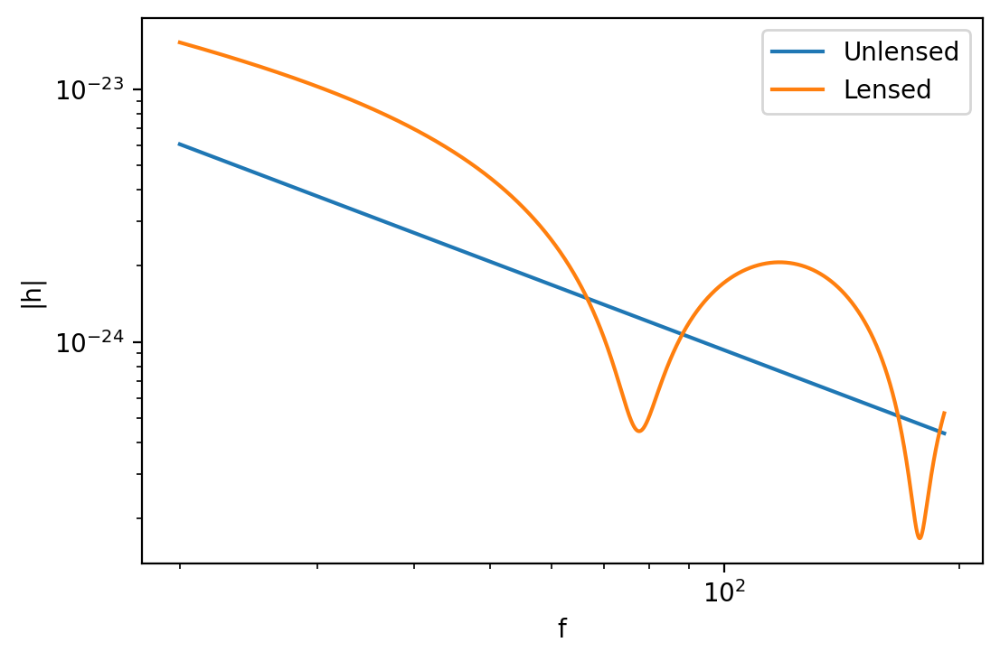

In [300]:
# default parameters
lensing_params = lensing_params_0.copy()

def_lens = Lensing(lensing_params)
total_mass = def_lens.total_mass()
f_cut = def_lens.f_cut()
f_range = np.linspace(20, f_cut, 10000)
amp_fact = def_lens.F(f_range)
unlensed_strain = def_lens.hI(f_range)

plt.loglog(f_range, np.abs(unlensed_strain), label="Unlensed")
plt.loglog(f_range, np.abs(amp_fact * unlensed_strain), label="Lensed")
plt.legend()
plt.xlabel("f")
plt.ylabel("|h|")

Text(0, 0.5, '|F|')

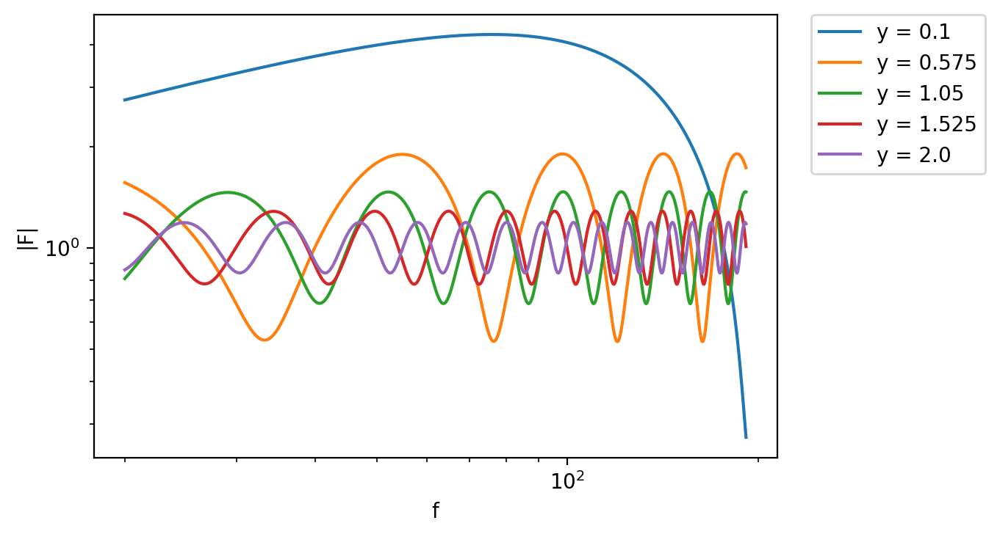

In [304]:
# make multiple plots for different values of y
lensing_params = lensing_params_0.copy()
y_range = np.linspace(0.1, 2, 5)

for y in y_range:
    lensing_params["y"] = y
    def_lens = Lensing(lensing_params)

    total_mass = def_lens.total_mass()
    f_cut = 1 / (6 ** (3 / 2) * np.pi * total_mass)
    f_range = np.linspace(20, f_cut, 10000)
    amp_fact = def_lens.F(f_range)

    plt.loglog(f_range, np.abs(amp_fact), label="y = {}".format(y))

plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)
plt.xlabel("f")
plt.ylabel("|F|")

Text(0, 0.5, '|h|')

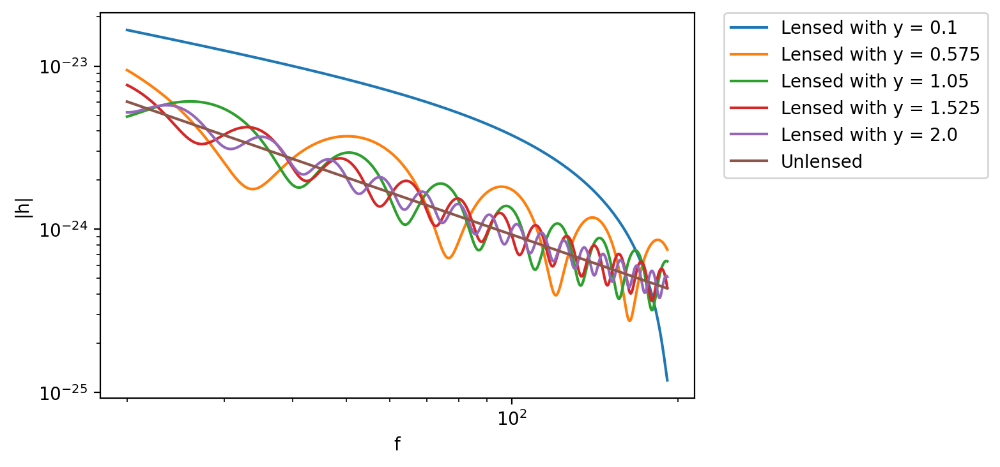

In [305]:
# make multiple plots for different values of y
lensing_params = lensing_params_0.copy()
y_range = np.linspace(0.1, 2, 5)

for y in y_range:
    lensing_params["y"] = y
    def_lens = Lensing(lensing_params)

    total_mass = def_lens.total_mass()
    f_cut = 1 / (6 ** (3 / 2) * np.pi * total_mass)
    f_range = np.linspace(20, f_cut, 10000)
    amp_fact = def_lens.F(f_range)
    unlensed_strain = def_lens.hI(f_range)

    plt.loglog(
        f_range,
        np.abs(amp_fact * unlensed_strain),
        label="Lensed with y = {}".format(y),
    )

plt.loglog(f_range, np.abs(unlensed_strain), label="Unlensed")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)
plt.xlabel("f")
plt.ylabel("|h|")

Text(0, 0.5, '|F|')

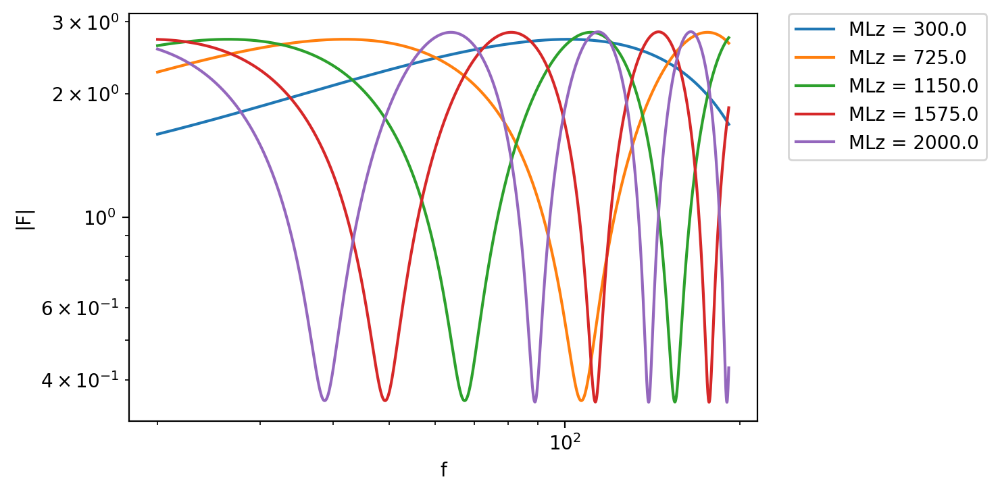

In [307]:
# make multiple plots for different values of MLz
lensing_params = lensing_params_0.copy()
MLz_range = np.linspace(1e3 - 7e2, 1e3 + 1e3, 5)

for MLz in MLz_range:
    lensing_params["MLz"] = MLz * solar_mass
    def_lens = Lensing(lensing_params)

    total_mass = def_lens.total_mass()
    f_cut = 1 / (6 ** (3 / 2) * np.pi * total_mass)
    f_range = np.linspace(20, f_cut, 10000)
    amp_fact = def_lens.F(f_range)

    plt.loglog(f_range, np.abs(amp_fact), label="MLz = {}".format(MLz))

plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)
plt.xlabel("f")
plt.ylabel("|F|")

Text(0, 0.5, '|h|')

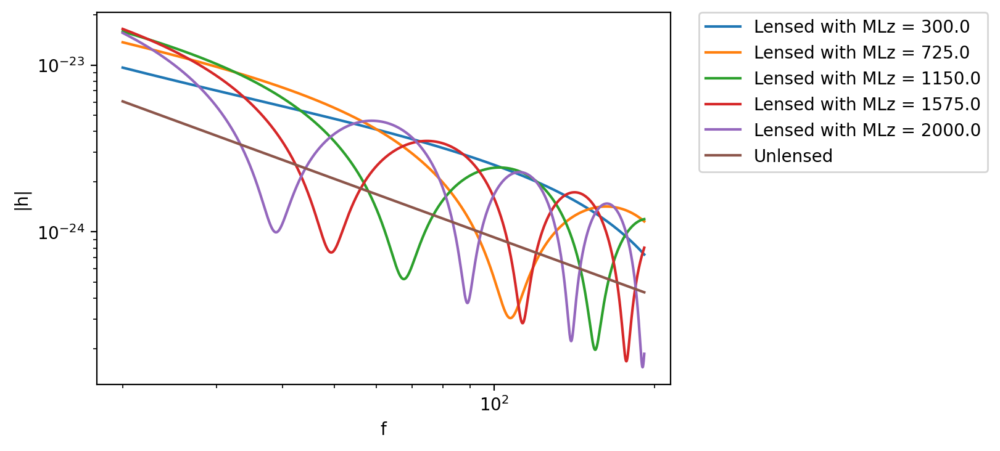

In [308]:
# make multiple plots for different values of MLz
lensing_params = lensing_params_0.copy()
MLz_range = np.linspace(1e3 - 7e2, 1e3 + 1e3, 5)

for MLz in MLz_range:
    lensing_params["MLz"] = MLz * solar_mass
    def_lens = Lensing(lensing_params)

    total_mass = def_lens.total_mass()
    f_cut = 1 / (6 ** (3 / 2) * np.pi * total_mass)
    f_range = np.linspace(20, f_cut, 10000)
    amp_fact = def_lens.F(f_range)
    unlensed_strain = def_lens.hI(f_range)

    plt.loglog(
        f_range,
        np.abs(amp_fact * unlensed_strain),
        label="Lensed with MLz = {}".format(MLz),
    )

plt.loglog(f_range, np.abs(unlensed_strain), label="Unlensed")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)
plt.xlabel("f")
plt.ylabel("|h|")

Text(0, 0.5, '|F|')

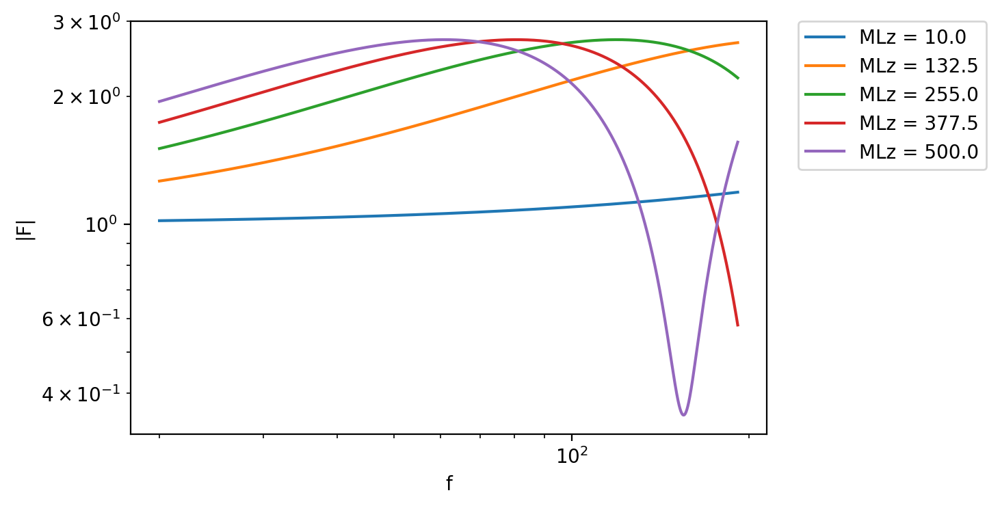

In [312]:
# make multiple plots for different values of MLz
lensing_params = lensing_params_0.copy()
MLz_range = np.linspace(1e1, 5e2, 5)

for MLz in MLz_range:
    lensing_params["MLz"] = MLz * solar_mass
    def_lens = Lensing(lensing_params)

    total_mass = def_lens.total_mass()
    f_cut = 1 / (6 ** (3 / 2) * np.pi * total_mass)
    f_range = np.linspace(20, f_cut, 10000)
    amp_fact = def_lens.F(f_range)

    plt.loglog(f_range, np.abs(amp_fact), label="MLz = {}".format(MLz))

plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)
plt.xlabel("f")
plt.ylabel("|F|")

Text(0, 0.5, '|h|')

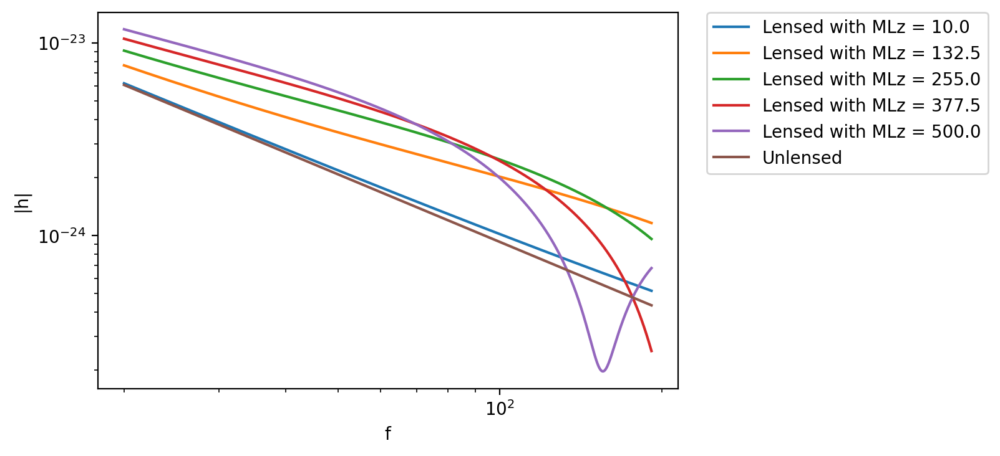

In [313]:
# make multiple plots for different values of MLz
lensing_params = lensing_params_0.copy()
MLz_range = np.linspace(1e1, 5e2, 5)

for MLz in MLz_range:
    lensing_params["MLz"] = MLz * solar_mass
    def_lens = Lensing(lensing_params)

    total_mass = def_lens.total_mass()
    f_cut = 1 / (6 ** (3 / 2) * np.pi * total_mass)
    f_range = np.linspace(20, f_cut, 10000)
    amp_fact = def_lens.F(f_range)
    unlensed_strain = def_lens.hI(f_range)

    plt.loglog(
        f_range,
        np.abs(amp_fact * unlensed_strain),
        label="Lensed with MLz = {}".format(MLz),
    )

plt.loglog(f_range, np.abs(unlensed_strain), label="Unlensed")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)
plt.xlabel("f")
plt.ylabel("|h|")

Text(0, 0.5, '|h|')

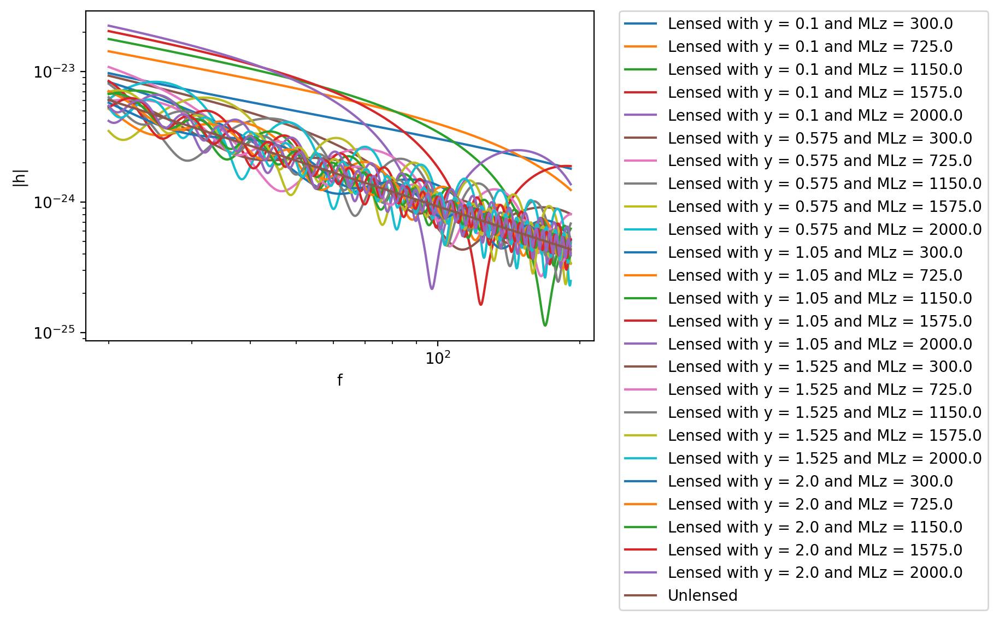

In [210]:
# # make multiple plots for different values of y and MLz
# y_range = np.linspace(0.1, 2, 5)
# MLz_range = np.linspace(1e3-7e2, 1e3+1e3, 5)

# for y in y_range:
#     for MLz in MLz_range:
#         lensing_params['y'] = y
#         lensing_params['MLz'] = MLz * solar_mass
#         def_lens = Lensing(lensing_params)
#         amp_fact = def_lens.F(f_range)
#         unlensed_strain = def_lens.hI(f_range)
#         plt.loglog(f_range, np.abs(amp_fact*unlensed_strain), label ='Lensed with y = {} and MLz = {}'.format(y, MLz))

# plt.loglog(f_range, np.abs(unlensed_strain), label ='Unlensed')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
# plt.xlabel('f')
# plt.ylabel('|h|')

Text(0, 0.5, '|h|')

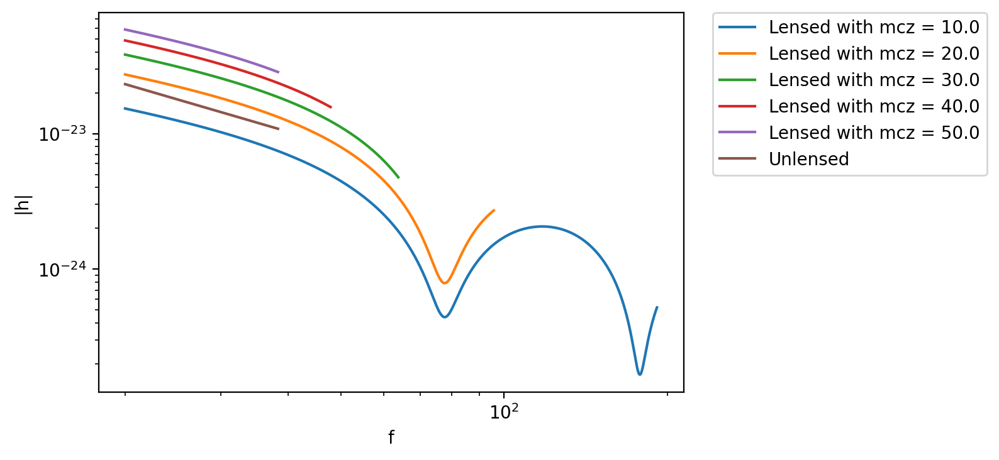

In [309]:
# make multiple plots for different values of mcz
lensing_params = lensing_params_0.copy()
mcz_range = np.linspace(10, 50, 5)

for mcz in mcz_range:
    lensing_params["mcz"] = mcz * solar_mass
    def_lens = Lensing(lensing_params)

    total_mass = def_lens.total_mass()
    f_cut = 1 / (6 ** (3 / 2) * np.pi * total_mass)
    f_range = np.linspace(20, f_cut, 10000)

    amp_fact = def_lens.F(f_range)
    unlensed_strain = def_lens.hI(f_range)

    plt.loglog(
        f_range,
        np.abs(amp_fact * unlensed_strain),
        label="Lensed with mcz = {}".format(mcz),
    )

plt.loglog(f_range, np.abs(unlensed_strain), label="Unlensed")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)
plt.xlabel("f")
plt.ylabel("|h|")

Text(0, 0.5, '|h|')

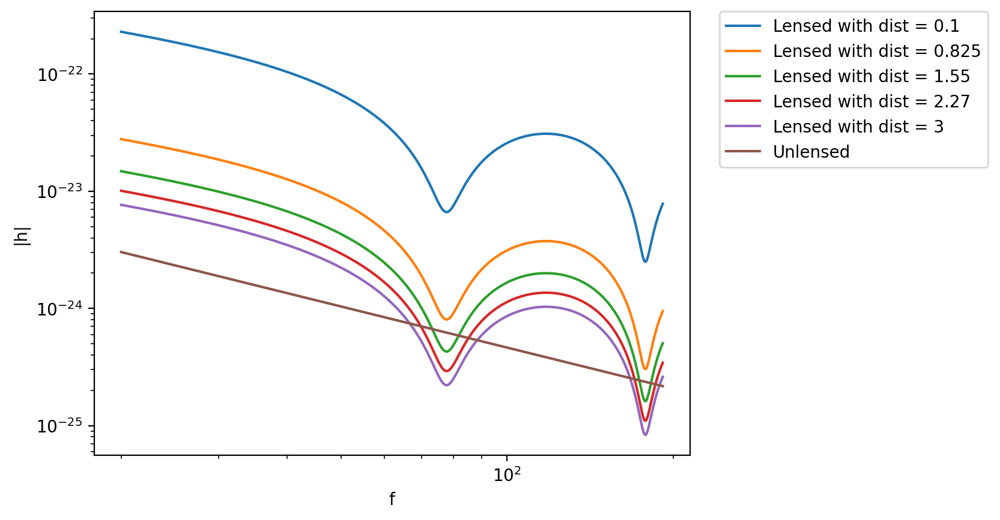

In [102]:
# make multiple plots for different values of dist
lensing_params = lensing_params_0.copy()
dist_range = np.linspace(0.1, 3, 5)

for dist in dist_range:
    lensing_params["dist"] = dist * giga_parsec
    def_lens = Lensing(lensing_params)

    total_mass = def_lens.total_mass()
    f_cut = 1 / (6 ** (3 / 2) * np.pi * total_mass)
    f_range = np.linspace(20, f_cut, 10000)

    amp_fact = def_lens.F(f_range)
    unlensed_strain = def_lens.hI(f_range)

    plt.loglog(
        f_range,
        np.abs(amp_fact * unlensed_strain),
        label="Lensed with dist = {:.3g}".format(dist),
    )

plt.loglog(f_range, np.abs(unlensed_strain), label="Unlensed")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)
plt.xlabel("f")
plt.ylabel("|h|")

## plot phase diff

Text(0, 0.5, 'Phase')

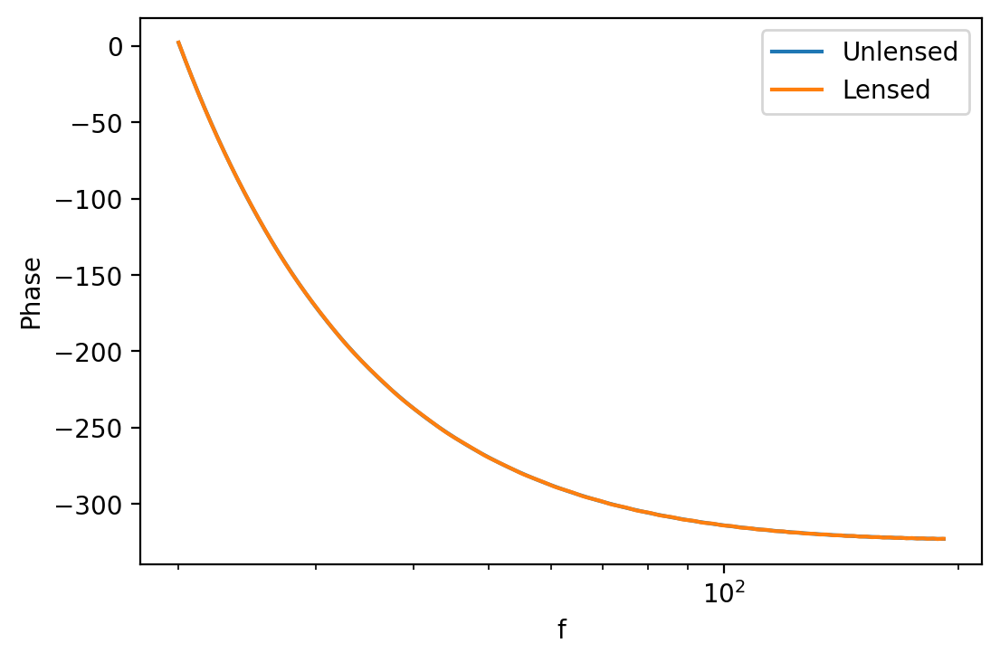

In [211]:
lensing_params = lensing_params_0.copy()

total_mass = def_lens.total_mass()
f_cut = def_lens.f_cut()
f_range = np.linspace(20, f_cut, 10000)
amp_fact = def_lens.F(f_range)
unlensed_strain = def_lens.hI(f_range)

phase_L = np.unwrap(np.angle(amp_fact * unlensed_strain))
phase_UL = np.unwrap(np.angle(unlensed_strain))
plt.plot(f_range, phase_UL, label="Unlensed")
plt.plot(f_range, phase_L, label="Lensed")
plt.legend()
plt.xscale("log")
plt.xlabel("f")
plt.ylabel("Phase")

Text(0, 0.5, 'Phase diff')

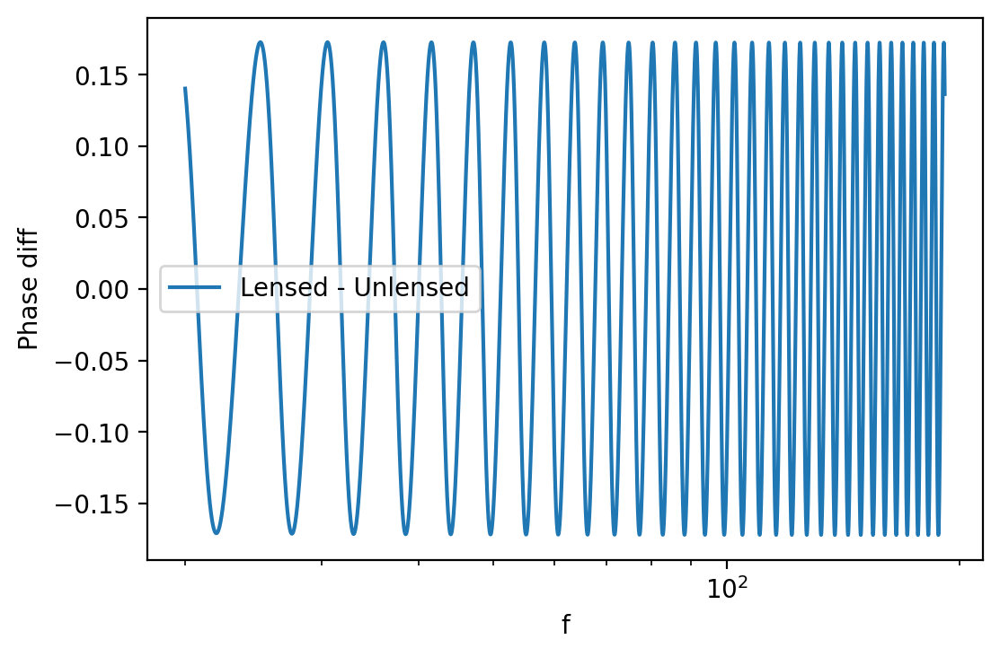

In [212]:
lensing_params = lensing_params_0.copy()

total_mass = def_lens.total_mass()
f_cut = def_lens.f_cut()
f_range = np.linspace(20, f_cut, 10000)
amp_fact = def_lens.F(f_range)
unlensed_strain = def_lens.hI(f_range)

phase_L = np.unwrap(np.angle(amp_fact * unlensed_strain))
phase_UL = np.unwrap(np.angle(unlensed_strain))
plt.plot(f_range, phase_L - phase_UL, label="Lensed - Unlensed")
plt.legend()
plt.xscale("log")
plt.xlabel("f")
plt.ylabel("Phase diff")

Text(0, 0.5, 'Phase diff')

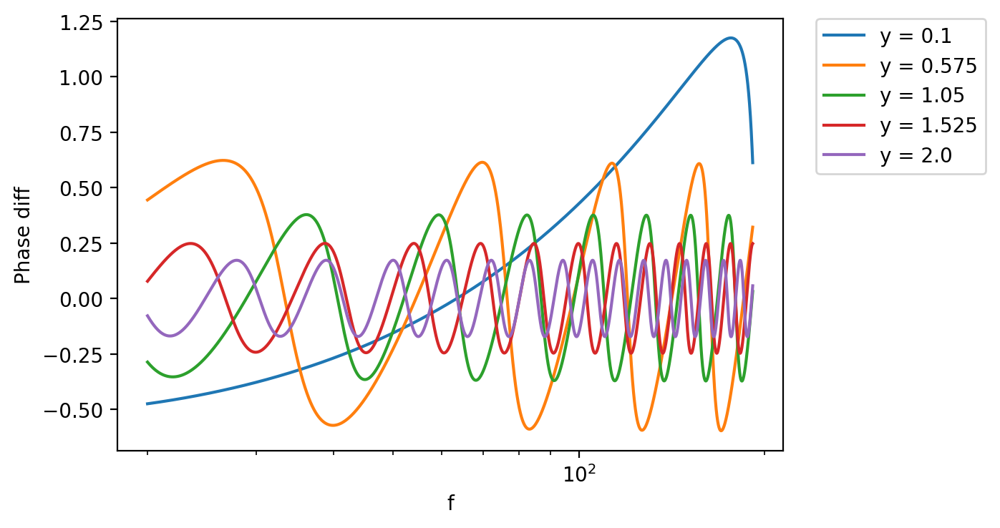

In [315]:
# make multiple plots for different values of y
lensing_params = lensing_params_0.copy()
y_range = np.linspace(0.1, 2, 5)

for y in y_range:
    lensing_params["y"] = y
    def_lens = Lensing(lensing_params)

    total_mass = def_lens.total_mass()
    f_cut = def_lens.f_cut()
    f_range = np.linspace(20, f_cut, 10000)

    amp_fact = def_lens.F(f_range)
    unlensed_strain = def_lens.hI(f_range)
    phase_L = np.unwrap(np.angle(amp_fact * unlensed_strain))
    phase_UL = np.unwrap(np.angle(unlensed_strain))

    plt.plot(f_range, phase_L - phase_UL, label="y = {}".format(y))

plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)
plt.xscale("log")
plt.xlabel("f")
plt.ylabel("Phase diff")

Text(0, 0.5, 'Phase diff')

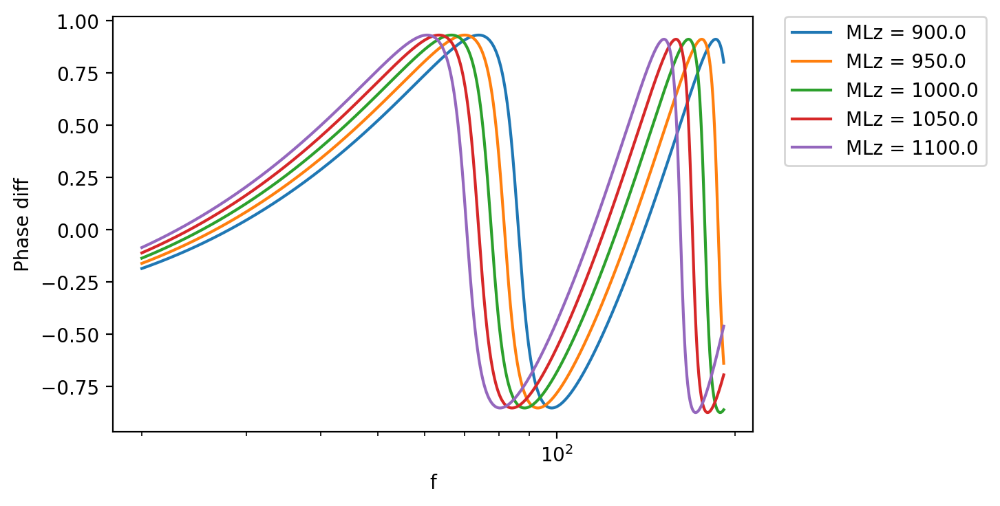

In [316]:
# make multiple plots for different values of MLz
lensing_params = lensing_params_0.copy()
MLz_range = np.linspace(1e3 - 1e2, 1e3 + 1e2, 5)

for MLz in MLz_range:
    lensing_params["MLz"] = MLz * solar_mass
    def_lens = Lensing(lensing_params)

    total_mass = def_lens.total_mass()
    f_cut = def_lens.f_cut()
    f_range = np.linspace(20, f_cut, 10000)

    amp_fact = def_lens.F(f_range)
    unlensed_strain = def_lens.hI(f_range)
    phase_L = np.unwrap(np.angle(amp_fact * unlensed_strain))
    phase_UL = np.unwrap(np.angle(unlensed_strain))

    plt.plot(f_range, phase_L - phase_UL, label="MLz = {}".format(MLz))

plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)
plt.xscale("log")
plt.xlabel("f")
plt.ylabel("Phase diff")

Text(0, 0.5, 'Phase diff')

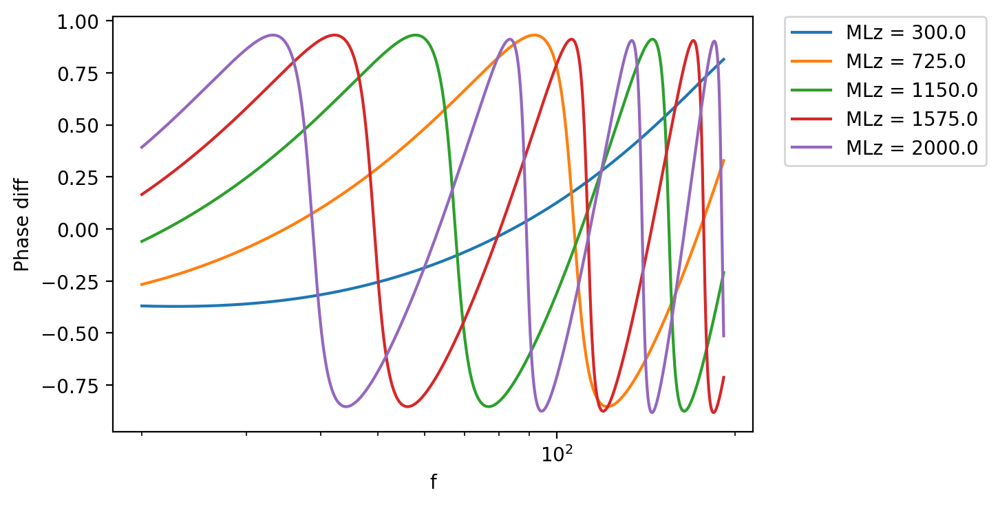

In [317]:
# make multiple plots for different values of MLz
lensing_params = lensing_params_0.copy()
MLz_range = np.linspace(1e3 - 7e2, 1e3 + 1e3, 5)  # increase the mass diff

for MLz in MLz_range:
    lensing_params["MLz"] = MLz * solar_mass
    def_lens = Lensing(lensing_params)

    total_mass = def_lens.total_mass()
    f_cut = def_lens.f_cut()
    f_range = np.linspace(20, f_cut, 10000)

    amp_fact = def_lens.F(f_range)
    unlensed_strain = def_lens.hI(f_range)
    phase_L = np.unwrap(np.angle(amp_fact * unlensed_strain))
    phase_UL = np.unwrap(np.angle(unlensed_strain))

    plt.plot(f_range, phase_L - phase_UL, label="MLz = {}".format(MLz))

plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)
plt.xscale("log")
plt.xlabel("f")
plt.ylabel("Phase diff")

Text(0, 0.5, 'Phase diff')

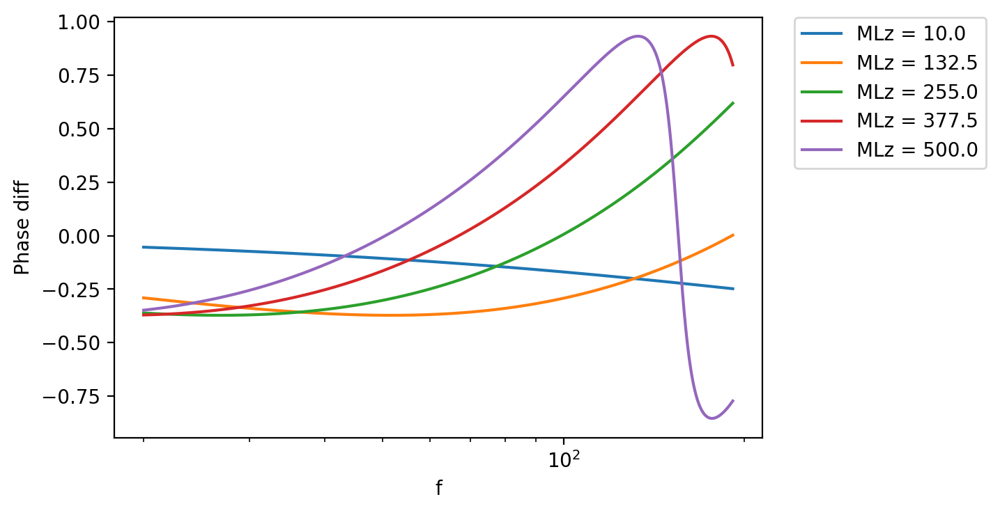

In [318]:
# make multiple plots for different values of MLz
lensing_params = lensing_params_0.copy()
MLz_range = np.linspace(1e1, 5e2, 5)

for MLz in MLz_range:
    lensing_params["MLz"] = MLz * solar_mass
    def_lens = Lensing(lensing_params)

    total_mass = def_lens.total_mass()
    f_cut = def_lens.f_cut()
    f_range = np.linspace(20, f_cut, 10000)

    amp_fact = def_lens.F(f_range)
    unlensed_strain = def_lens.hI(f_range)
    phase_L = np.unwrap(np.angle(amp_fact * unlensed_strain))
    phase_UL = np.unwrap(np.angle(unlensed_strain))

    plt.plot(f_range, phase_L - phase_UL, label="MLz = {}".format(MLz))

plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)
plt.xscale("log")
plt.xlabel("f")
plt.ylabel("Phase diff")

Text(0, 0.5, 'Phase diff')

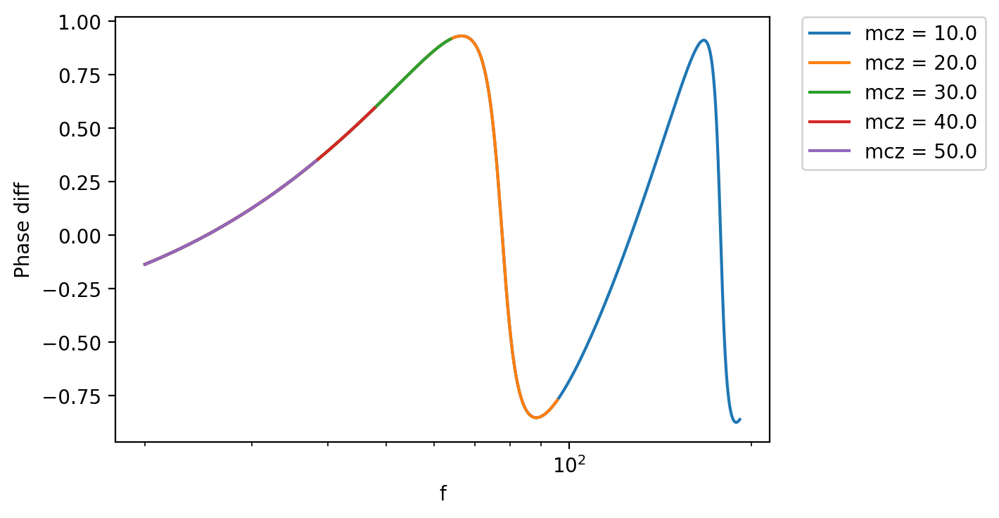

In [319]:
# phase diff for different values of mcz
lensing_params = lensing_params_0.copy()
mcz_range = np.linspace(10, 50, 5)

for mcz in mcz_range:
    lensing_params["mcz"] = mcz * solar_mass
    def_lens = Lensing(lensing_params)

    total_mass = def_lens.total_mass()
    f_cut = def_lens.f_cut()
    f_range = np.linspace(20, f_cut, 10000)

    amp_fact = def_lens.F(f_range)
    unlensed_strain = def_lens.hI(f_range)
    phase_L = np.unwrap(np.angle(amp_fact * unlensed_strain))
    phase_UL = np.unwrap(np.angle(unlensed_strain))

    plt.plot(f_range, phase_L - phase_UL, label="mcz = {}".format(mcz))

plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)
plt.xscale("log")
plt.xlabel("f")
plt.ylabel("Phase diff")

Text(0, 0.5, 'Phase diff')

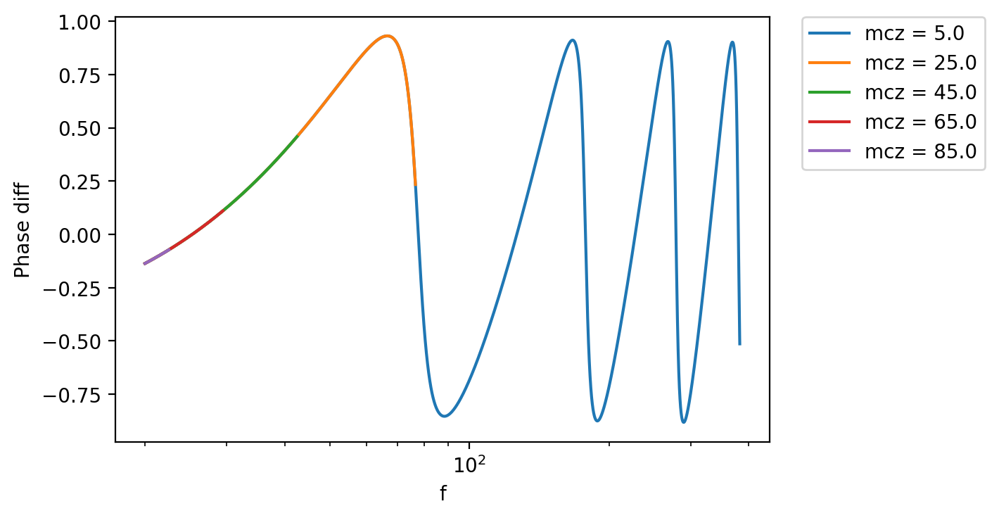

In [330]:
# phase diff for different values of mcz
lensing_params = lensing_params_0.copy()
mcz_range = np.linspace(5, 85, 5)

for mcz in mcz_range:
    lensing_params["mcz"] = mcz * solar_mass
    def_lens = Lensing(lensing_params)

    total_mass = def_lens.total_mass()
    f_cut = def_lens.f_cut()
    f_range = np.linspace(20, f_cut, 10000)

    amp_fact = def_lens.F(f_range)
    unlensed_strain = def_lens.hI(f_range)
    phase_L = np.unwrap(np.angle(amp_fact * unlensed_strain))
    phase_UL = np.unwrap(np.angle(unlensed_strain))

    plt.plot(f_range, phase_L - phase_UL, label="mcz = {}".format(mcz))

plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)
plt.xscale("log")
plt.xlabel("f")
plt.ylabel("Phase diff")

Text(0.5, 0, 'f')

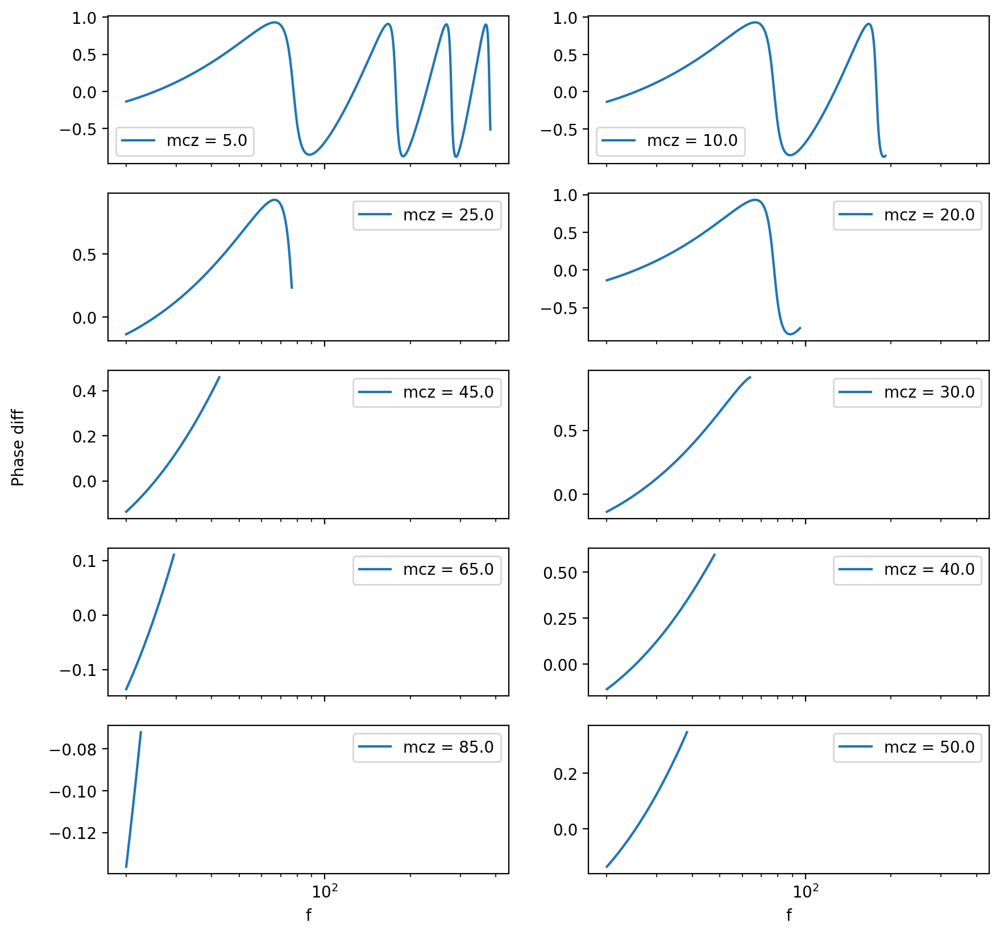

In [339]:
# make a panel of plots for phase diff with different values of mcz
lensing_params = lensing_params_0.copy()
fig, axs = plt.subplots(5, 2, figsize=(10, 10), sharex=True)

mcz_range = np.linspace(5, 85, 5)
for r, mcz in enumerate(mcz_range):
    lensing_params["mcz"] = mcz * solar_mass
    def_lens = Lensing(lensing_params)

    total_mass = def_lens.total_mass()
    f_cut = def_lens.f_cut()
    f_range = np.arange(20, f_cut, 0.05)

    amp_fact = def_lens.F(f_range)
    unlensed_strain = def_lens.hI(f_range)
    phase_L = np.unwrap(np.angle(amp_fact * unlensed_strain))
    phase_UL = np.unwrap(np.angle(unlensed_strain))

    axs[r, 0].plot(f_range, phase_L - phase_UL, label="mcz = {}".format(mcz))
    axs[r, 0].set_xscale("log")
    axs[r, 0].legend()

mcz_range = np.linspace(10, 50, 5)
for r, mcz in enumerate(mcz_range):
    lensing_params["mcz"] = mcz * solar_mass
    def_lens = Lensing(lensing_params)

    total_mass = def_lens.total_mass()
    f_cut = def_lens.f_cut()
    f_range = np.arange(20, f_cut, 0.05)

    amp_fact = def_lens.F(f_range)
    unlensed_strain = def_lens.hI(f_range)
    phase_L = np.unwrap(np.angle(amp_fact * unlensed_strain))
    phase_UL = np.unwrap(np.angle(unlensed_strain))

    axs[r, 1].plot(f_range, phase_L - phase_UL, label="mcz = {}".format(mcz))
    axs[r, 1].set_xscale("log")
    axs[r, 1].legend()

# set x and y labels for the entire panel
fig.text(0.04, 0.5, "Phase diff", va="center", rotation="vertical")
axs[4, 0].set_xlabel("f")
axs[4, 1].set_xlabel("f")

# precessing

## plot amplitudes

/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_14410/3108877990.py:159: RuntimeWarning: divide by zero encountered in double_scalars
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_14410/3108877990.py:159: RuntimeWarning: invalid value encountered in double_scalars
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot


Text(0.5, 0.98, 'left column: $\\tilde{\\Omega}$ = 1.0, right column: $\\tilde{\\Omega}$ = 2.0')

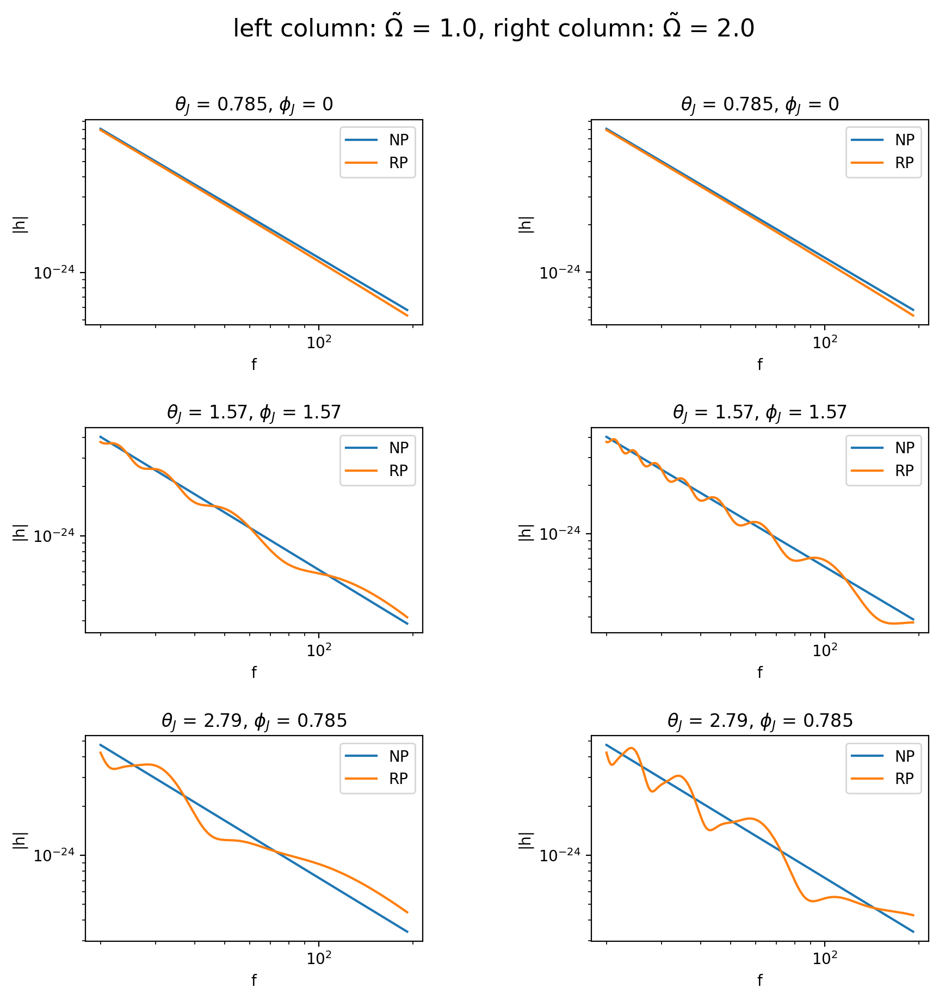

In [220]:
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

# make a panel of plots for different sky locations using sky_locs_J_E (Evangelos's choice)

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10, 10))
fig.subplots_adjust(hspace=0.5)
fig.subplots_adjust(wspace=0.5)

for c, omega_tilde in enumerate([1.0, 2.0]):
    RP_params["omega_tilde"] = omega_tilde

    for r, (theta_J, phi_J) in enumerate(sky_locs_J_E):
        RP_params["theta_J"] = NP_params["theta_J"] = theta_J
        RP_params["phi_J"] = NP_params["phi_J"] = phi_J

        def_prec = Precessing(RP_params)
        def_non_prec = Precessing(NP_params)

        f_cut = Precessing(RP_params).f_cut()
        f_min = 20
        delta_f = 0.05
        f_range = np.arange(f_min, f_cut, delta_f)

        precessing_strain = def_prec.strain(f_range)
        non_precessing_strain = def_non_prec.strain(f_range)

        axes[r, c].loglog(f_range, np.abs(non_precessing_strain), label="NP")
        axes[r, c].loglog(f_range, np.abs(precessing_strain), label="RP")
        axes[r, c].legend(loc="upper right")
        axes[r, c].set_xlabel("f")
        axes[r, c].set_ylabel("|h|")
        axes[r, c].set_title(
            r"$\theta_J$ = {:.3g}, $\phi_J$ = {:.3g}".format(theta_J, phi_J)
        )

# add title for the entire figure
fig.suptitle(
    r"left column: $\tilde{\Omega}$ = 1.0, right column: $\tilde{\Omega}$ = 2.0",
    fontsize=16,
)

/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_14410/3108877990.py:159: RuntimeWarning: divide by zero encountered in double_scalars
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_14410/3108877990.py:159: RuntimeWarning: invalid value encountered in double_scalars
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_14410/3108877990.py:105: RuntimeWarning: divide by zero encountered in divide
  tan_psi = num_psi / den_psi


Text(0.5, 0.98, 'left column: $\\tilde{\\Omega}$ = 1.0, right column: $\\tilde{\\Omega}$ = 2.0')

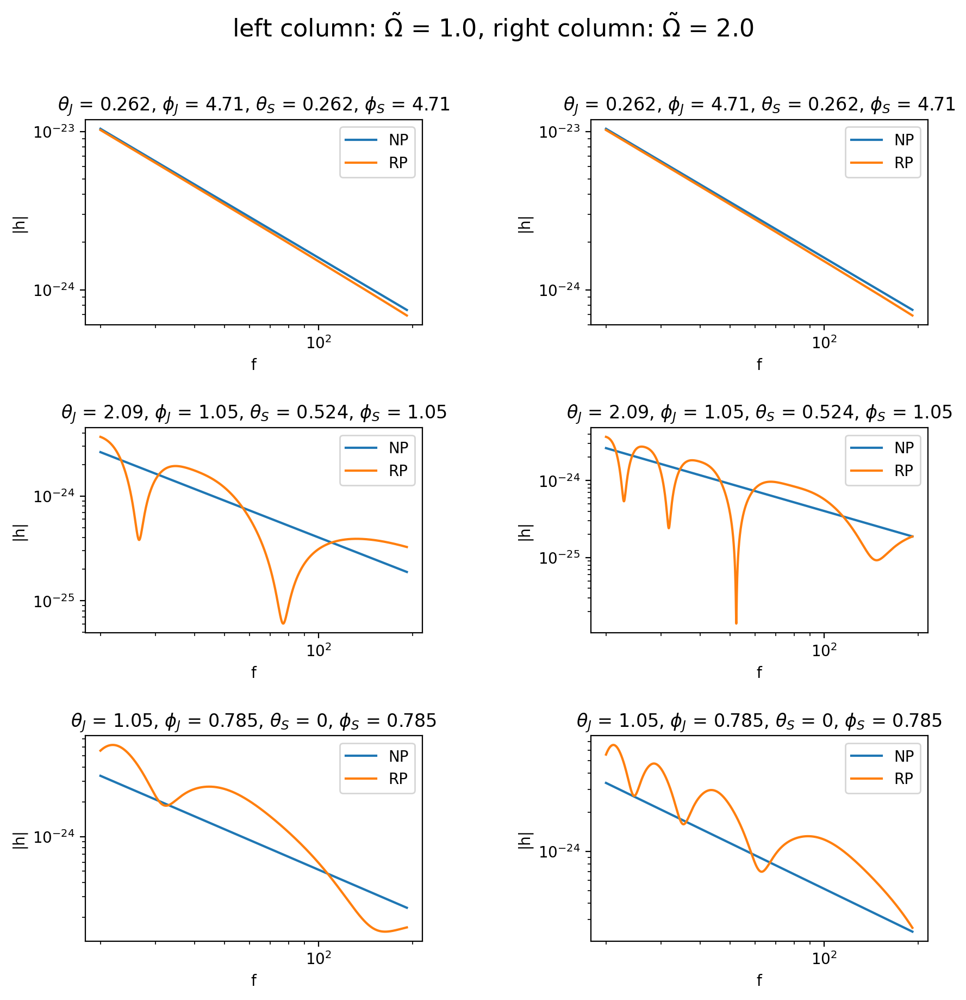

In [364]:
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

# make a panel of plots for different sky locations using sky_locs_J_S and sky_locs_S_S (Saif's choice)

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10, 10))
fig.subplots_adjust(hspace=0.5)
fig.subplots_adjust(wspace=0.5)

for c, omega_tilde in enumerate([1.0, 2.0]):
    RP_params["omega_tilde"] = omega_tilde

    for r, ((theta_J, phi_J), (theta_S, phi_S)) in enumerate(
        zip(sky_locs_J_S, sky_locs_S_S)
    ):
        RP_params["theta_J"] = NP_params["theta_J"] = theta_J
        RP_params["phi_J"] = NP_params["phi_J"] = phi_J
        RP_params["theta_S"] = NP_params["theta_S"] = theta_S
        RP_params["phi_S"] = NP_params["phi_S"] = phi_S

        def_prec = Precessing(RP_params)
        def_non_prec = Precessing(NP_params)

        f_cut = Precessing(RP_params).f_cut()
        f_min = 20
        delta_f = 0.05
        f_range = np.arange(f_min, f_cut, delta_f)

        precessing_strain = def_prec.strain(f_range)
        non_precessing_strain = def_non_prec.strain(f_range)

        axes[r, c].loglog(f_range, np.abs(non_precessing_strain), label="NP")
        axes[r, c].loglog(f_range, np.abs(precessing_strain), label="RP")
        axes[r, c].legend(loc="upper right")
        axes[r, c].set_xlabel("f")
        axes[r, c].set_ylabel("|h|")
        axes[r, c].set_title(
            r"$\theta_J$ = {:.3g}, $\phi_J$ = {:.3g}, $\theta_S$ = {:.3g}, $\phi_S$ = {:.3g}".format(
                theta_J, phi_J, theta_S, phi_S
            )
        )

# add title for the entire figure
fig.suptitle(
    r"left column: $\tilde{\Omega}$ = 1.0, right column: $\tilde{\Omega}$ = 2.0",
    fontsize=16,
)

In [55]:
# using sky_locs_J_S and sky_locs_S_S (Saif's choice)
sky_locs_J = sky_locs_J_S.copy()
sky_locs_S = sky_locs_S_S.copy()


def precession_plot_panel_h(param_name, param_unit, param_range, param_label, title):
    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 10))
    fig.subplots_adjust(hspace=0.5)
    fig.subplots_adjust(wspace=0.5)

    for r, ((theta_J, phi_J), (theta_S, phi_S)) in enumerate(
        zip(sky_locs_J, sky_locs_S)
    ):
        RP_params["theta_J"] = NP_params["theta_J"] = theta_J
        RP_params["phi_J"] = NP_params["phi_J"] = phi_J
        RP_params["theta_S"] = NP_params["theta_S"] = theta_S
        RP_params["phi_S"] = NP_params["phi_S"] = phi_S

        ##
        for param in param_range:
            RP_params[param_name] = param * param_unit
            def_prec = Precessing(RP_params)
            f_cut = def_prec.f_cut()
            f_min = 20
            delta_f = 0.05
            f_range = np.arange(f_min, f_cut, delta_f)
            precessing_strain = def_prec.strain(f_range)
            axes[r].loglog(
                f_range,
                np.abs(precessing_strain),
                label="RP with {} = {:.3g}".format(param_label, param),
            )
        ##

        def_non_prec = Precessing(NP_params)
        f_cut_NP = def_non_prec.f_cut()
        f_min_NP = 20
        delta_f = 0.05
        f_range_NP = np.arange(f_min_NP, f_cut_NP, delta_f)
        non_precessing_strain = def_non_prec.strain(f_range_NP)
        param_NP = NP_params[param_name] / param_unit
        axes[r].loglog(
            f_range_NP,
            np.abs(non_precessing_strain),
            label="NP with {} = {:.3g}".format(param_label, param_NP),
        )

        axes[r].legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)
        axes[r].set_title(
            r"$\theta_J$ = {:.3g}, $\phi_J$ = {:.3g}, $\theta_S$ = {:.3g}, $\phi_S$ = {:.3g}".format(
                theta_J, phi_J, theta_S, phi_S
            )
        )

    fig.suptitle(title, fontsize=16)
    # set x and y labels for the entire panel
    fig.text(0.04, 0.5, "|h|", va="center", rotation="vertical")
    axes[-1].set_xlabel("f")

/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: divide by zero encountered in scalar divide
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: invalid value encountered in scalar multiply
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:105: RuntimeWarning: divide by zero encountered in divide
  tan_psi = num_psi / den_psi


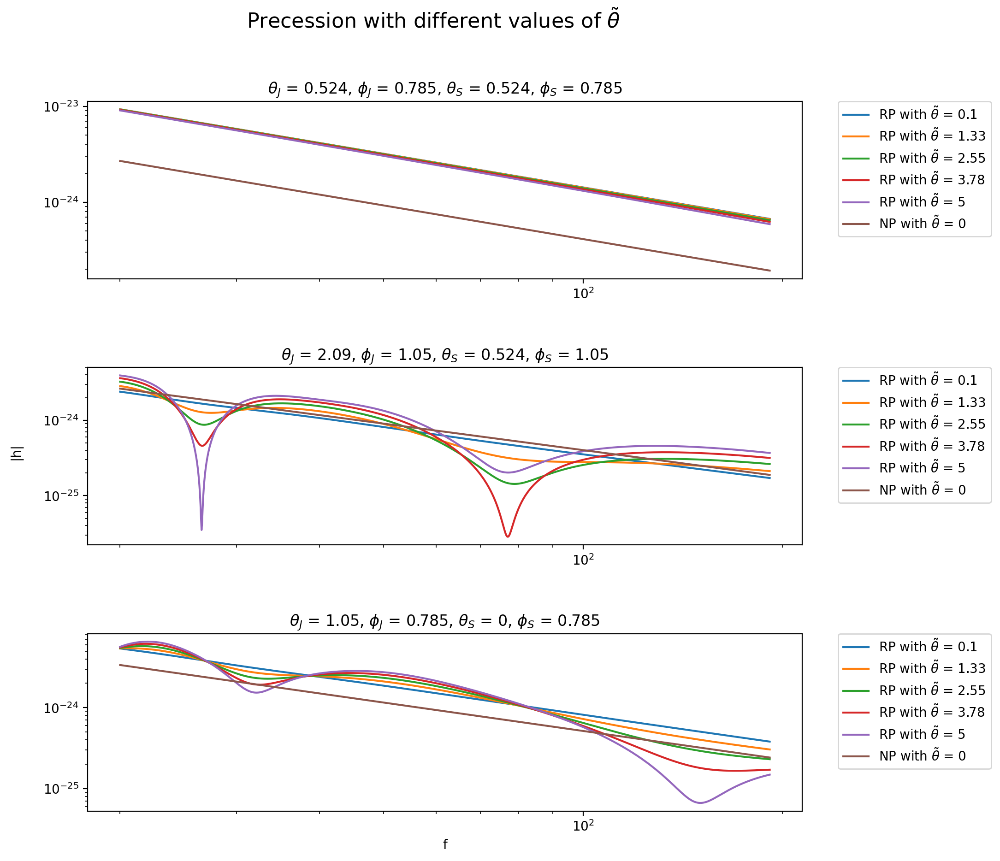

In [56]:
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

# using sky_locs_J_S and sky_locs_S_S (Saif's choice)
sky_locs_J = sky_locs_J_S.copy()
sky_locs_S = sky_locs_S_S.copy()

# change values of theta_tilde in RP_params
theta_tilde_range = np.linspace(0.1, 5, 5)

precession_plot_panel_h(
    "theta_tilde",
    1,
    theta_tilde_range,
    r"$\tilde{\theta}$",
    r"Precession with different values of $\tilde{\theta}$",
)

/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: divide by zero encountered in scalar divide
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: invalid value encountered in scalar multiply
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:105: RuntimeWarning: divide by zero encountered in divide
  tan_psi = num_psi / den_psi


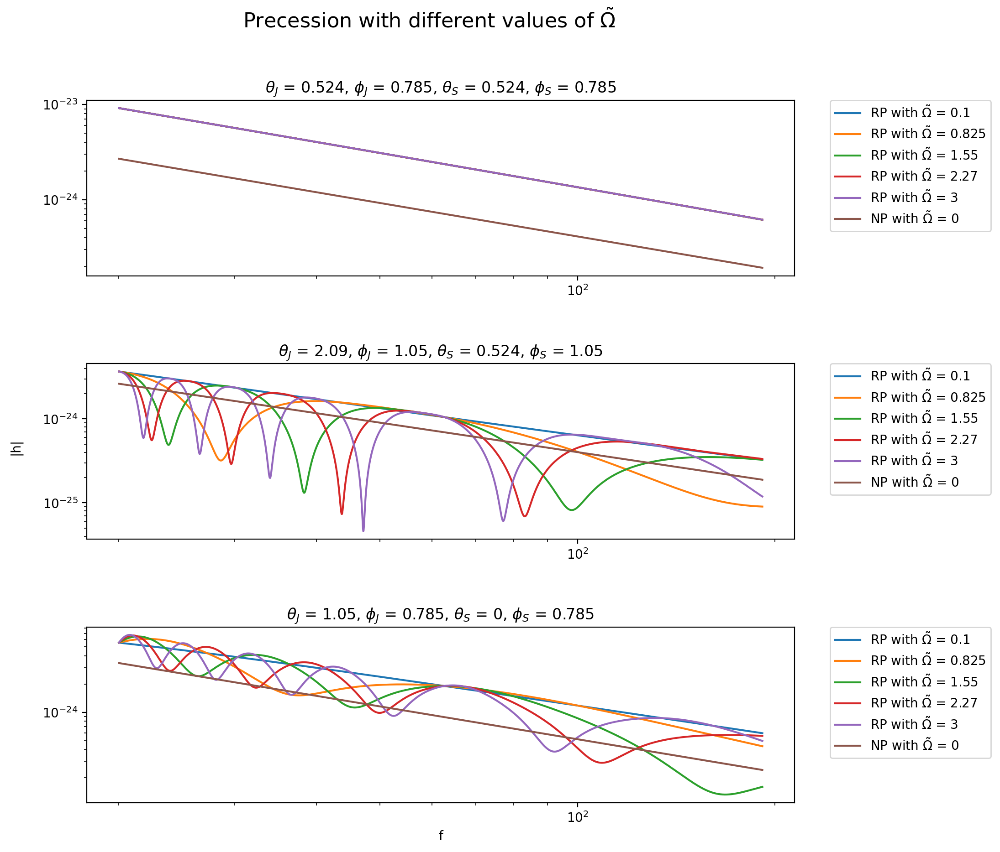

In [57]:
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

# using sky_locs_J_S and sky_locs_S_S (Saif's choice)
sky_locs_J = sky_locs_J_S.copy()
sky_locs_S = sky_locs_S_S.copy()

# change values of omega_tilde in RP_params
omega_tilde_range = np.linspace(0.1, 3, 5)

precession_plot_panel_h(
    "omega_tilde",
    1,
    omega_tilde_range,
    r"$\tilde{\Omega}$",
    r"Precession with different values of $\tilde{\Omega}$",
)

/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: divide by zero encountered in scalar divide
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: invalid value encountered in scalar multiply
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:105: RuntimeWarning: divide by zero encountered in divide
  tan_psi = num_psi / den_psi


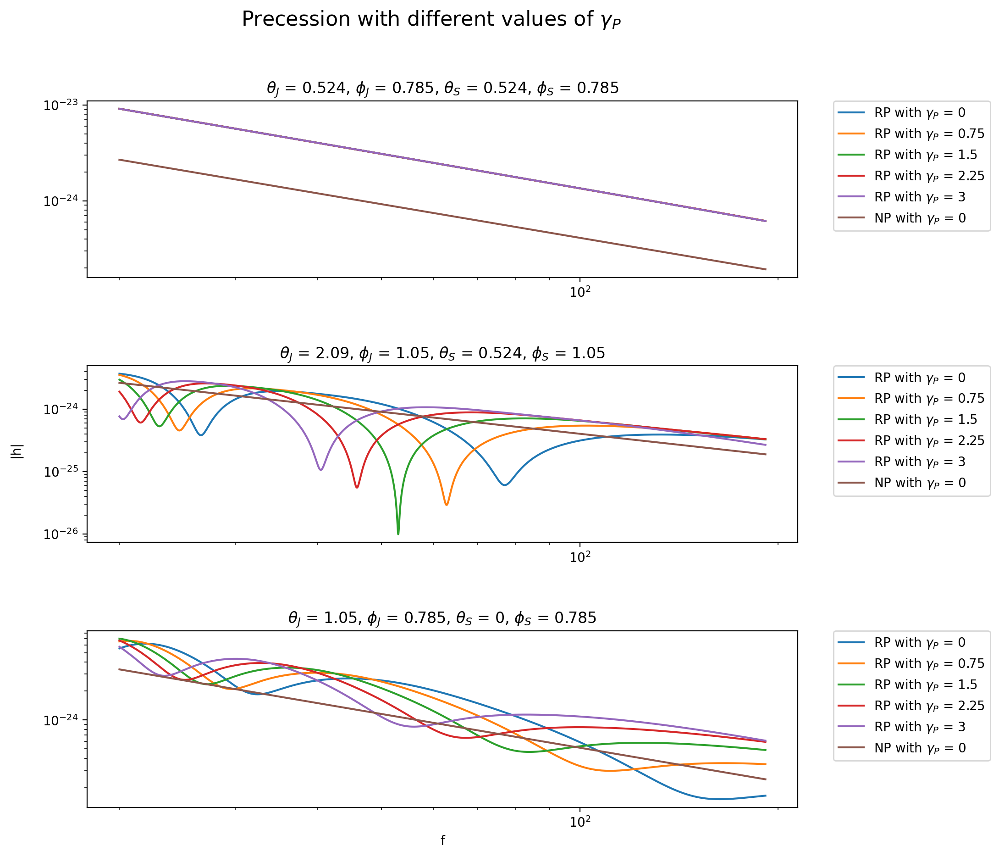

In [58]:
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

# using sky_locs_J_S and sky_locs_S_S (Saif's choice)
sky_locs_J = sky_locs_J_S.copy()
sky_locs_S = sky_locs_S_S.copy()

# change values of gamma_P in RP_params
gamma_P_range = np.linspace(0, 3, 5)

precession_plot_panel_h(
    "gamma_P",
    1,
    gamma_P_range,
    r"$\gamma_P$",
    r"Precession with different values of $\gamma_P$",
)

/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: divide by zero encountered in scalar divide
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: invalid value encountered in scalar multiply
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:105: RuntimeWarning: divide by zero encountered in divide
  tan_psi = num_psi / den_psi


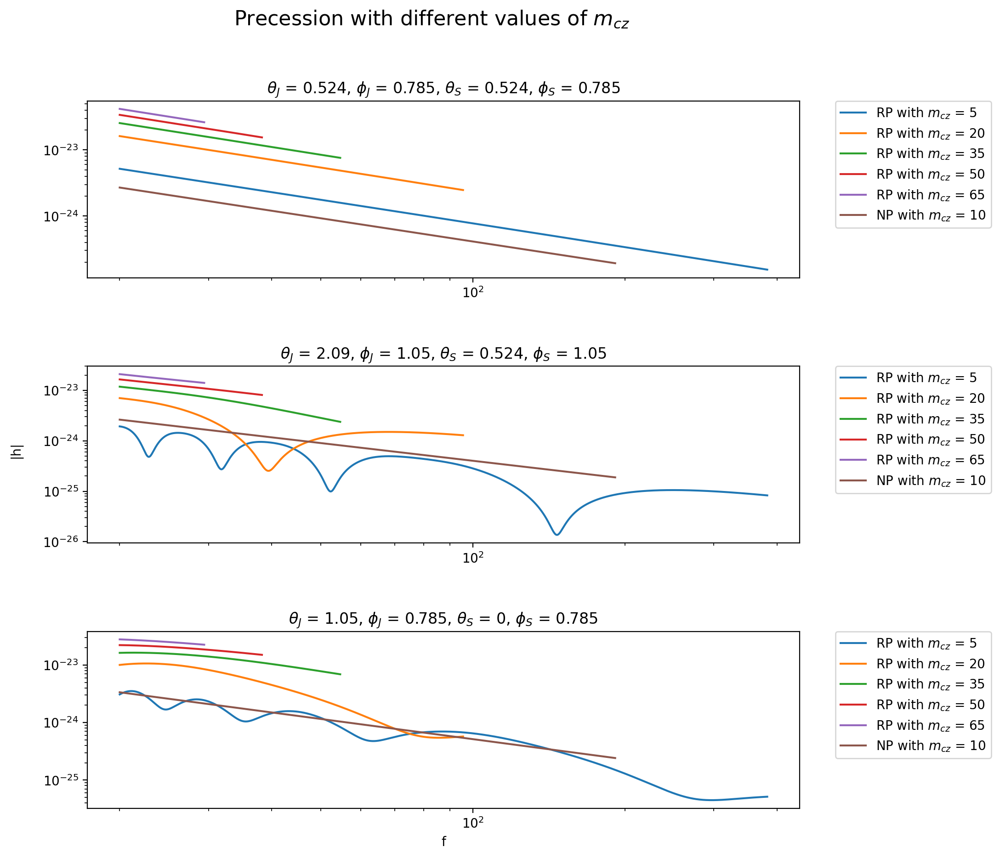

In [59]:
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

# using sky_locs_J_S and sky_locs_S_S (Saif's choice)
sky_locs_J = sky_locs_J_S.copy()
sky_locs_S = sky_locs_S_S.copy()

# change values of mcz in RP_params
mcz_range = np.linspace(5, 65, 5)
NP_params["mcz"] = 10 * solar_mass

precession_plot_panel_h(
    "mcz",
    solar_mass,
    mcz_range,
    r"$m_{cz}$",
    r"Precession with different values of $m_{cz}$",
)

/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: divide by zero encountered in scalar divide
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: invalid value encountered in scalar multiply
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot


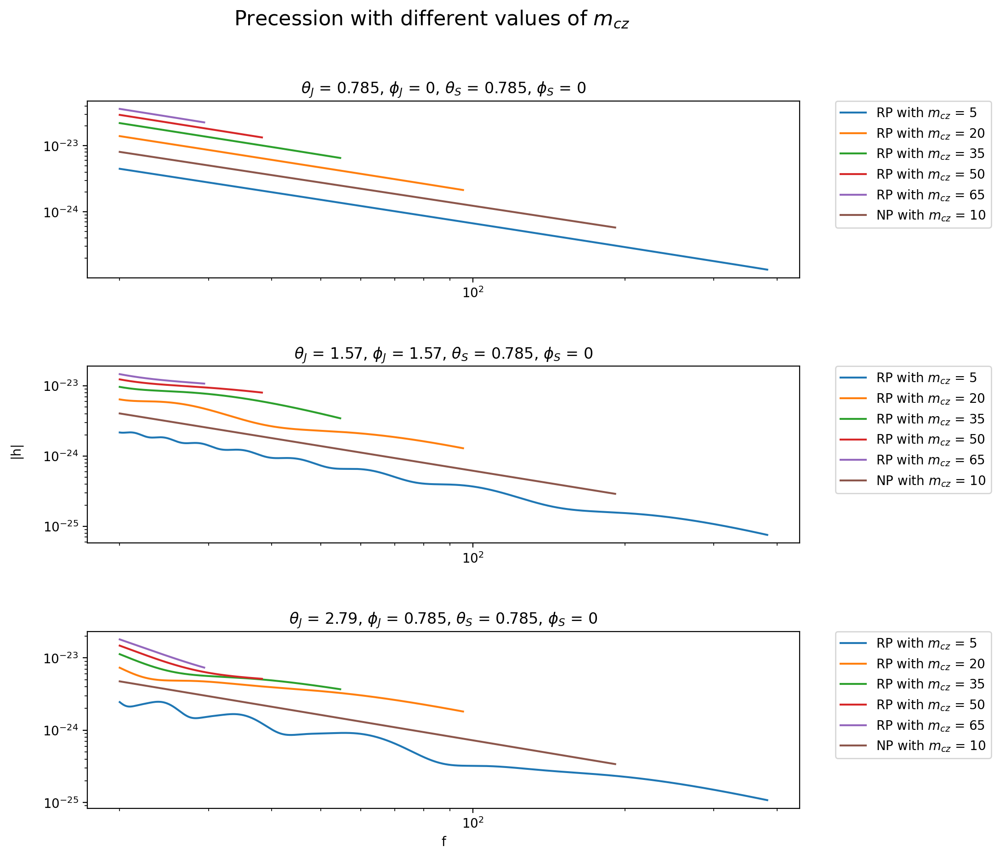

In [60]:
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

# using sky_locs_J_E and sky_locs_S_E (Evangelos's choice)
sky_locs_J = sky_locs_J_E.copy()
sky_locs_S = sky_locs_S_E.copy()

# change values of mcz in RP_params
mcz_range = np.linspace(5, 65, 5)
NP_params["mcz"] = 10 * solar_mass

precession_plot_panel_h(
    "mcz",
    solar_mass,
    mcz_range,
    r"$m_{cz}$",
    r"Precession with different values of $m_{cz}$",
)

In [61]:
# make a general slider plot for varying any parameter


def slider_plot_h(param_name, param_unit, param, param_label, title):
    RP_params[param_name] = param * param_unit
    def_prec = Precessing(RP_params)
    f_cut = def_prec.f_cut()
    f_min = 20
    delta_f = 0.05
    f_range = np.arange(f_min, f_cut, delta_f)
    precessing_strain = def_prec.strain(f_range)

    plt.loglog(
        f_range,
        np.abs(precessing_strain),
        label="RP with {} = {:.3g}".format(param_label, param),
    )
    plt.legend()
    plt.xlabel("f")
    plt.xlim(20, 5e2)
    plt.ylabel("|h|")
    plt.ylim(1e-26, 1e-22)
    plt.title(title, fontsize=12)

In [62]:
# face-on
RP_params["theta_J"] = np.pi / 12
RP_params["phi_J"] = np.pi / 2
RP_params["theta_S"] = np.pi / 12
RP_params["phi_S"] = np.pi / 2

# change values of mcz in RP_params
mcz_range = widgets.FloatSlider(
    min=5, max=65, step=5, value=10, description=r"$m_{cz}$"
)
NP_params["mcz"] = 20 * solar_mass

interact(
    slider_plot_h,
    param_name=fixed("mcz"),
    param_unit=fixed(solar_mass),
    param=mcz_range,
    param_label=fixed(r"$m_{cz}$"),
    title=fixed(r"Precession in face-on with different values of $m_{cz}$"),
)

interactive(children=(FloatSlider(value=10.0, description='$m_{cz}$', max=65.0, min=5.0, step=5.0), Output()),…

In [63]:
# edge-on
RP_params["theta_J"] = np.pi / 2
RP_params["phi_J"] = np.pi / 2
RP_params["theta_S"] = np.pi / 4
RP_params["phi_S"] = 0

# change values of mcz in RP_params
mcz_range = widgets.FloatSlider(
    min=5, max=65, step=5, value=10, description=r"$m_{cz}$"
)
NP_params["mcz"] = 20 * solar_mass

interact(
    slider_plot_h,
    param_name=fixed("mcz"),
    param_unit=fixed(solar_mass),
    param=mcz_range,
    param_label=fixed(r"$m_{cz}$"),
    title=fixed(r"Precession in edge-on with different values of $m_{cz}$"),
)

interactive(children=(FloatSlider(value=10.0, description='$m_{cz}$', max=65.0, min=5.0, step=5.0), Output()),…

In [64]:
# random
RP_params["theta_J"] = np.pi / 3
RP_params["phi_J"] = np.pi / 4
RP_params["theta_S"] = 0
RP_params["phi_S"] = np.pi / 4

# change values of mcz in RP_params
mcz_range = widgets.FloatSlider(
    min=5, max=65, step=5, value=10, description=r"$m_{cz}$"
)
NP_params["mcz"] = 20 * solar_mass

interact(
    slider_plot_h,
    param_name=fixed("mcz"),
    param_unit=fixed(solar_mass),
    param=mcz_range,
    param_label=fixed(r"$m_{cz}$"),
    title=fixed(r"Precession in random with different values of $m_{cz}$"),
)

interactive(children=(FloatSlider(value=10.0, description='$m_{cz}$', max=65.0, min=5.0, step=5.0), Output()),…

### plot face-on at various sky locs

In [73]:
# make a slider plot for face-on with varying mcz and phi_J, phi_S

mcz_range = np.empty(0)

def slider_plot_mcz_FaceOn_h(theta, phi, title):
    # set sky locations to face-on
    RP_params["theta_J"] = NP_params["theta_J"] = theta
    RP_params["phi_J"] = NP_params["phi_J"] = phi
    RP_params["theta_S"] = NP_params["theta_S"] = theta
    RP_params["phi_S"] = NP_params["phi_S"] = phi

    ##
    for mcz in mcz_range:
        RP_params["mcz"] = mcz * solar_mass
        def_prec = Precessing(RP_params)
        f_cut = def_prec.f_cut()
        f_min = 20
        delta_f = 0.05
        f_range = np.arange(f_min, f_cut, delta_f)
        precessing_strain = def_prec.strain(f_range)
        plt.loglog(
            f_range,
            np.abs(precessing_strain),
            label="RP with {} = {:.3g} {}".format(r"$m_{cz}$", mcz, r"$M_{\odot}$"),
        )
    ##

    def_non_prec = Precessing(NP_params)
    f_cut_NP = def_non_prec.f_cut()
    f_min_NP = 20
    delta_f = 0.05
    f_range_NP = np.arange(f_min_NP, f_cut_NP, delta_f)
    non_precessing_strain = def_non_prec.strain(f_range_NP)
    mcz_NP = NP_params["mcz"] / solar_mass
    plt.loglog(
        f_range_NP,
        np.abs(non_precessing_strain),
        label="NP with {} = {:.3g} {}".format(r"$m_{cz}$", mcz_NP, r"$M_{\odot}$"),
    )

    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)
    plt.xlabel("f")
    plt.xlim(20, 120)
    plt.ylabel("|h|")
    plt.ylim(1e-25, 1e-22)
    plt.title(title, fontsize=12)

In [74]:
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

# change values of mcz in RP_params
mcz_range = np.linspace(20, 20, 1)
NP_params["mcz"] = 20 * solar_mass

# vary theta from 0 to pi
theta_range = widgets.FloatSlider(
    min=0, max=np.pi, step=np.pi / 12, value=np.pi / 2, description="theta"
)

# vary phi from 0 to 2pi
phi_range = widgets.FloatSlider(
    min=0, max=2 * np.pi, step=np.pi / 12, value=np.pi, description="phi"
)

# make plot with 2 sliders for theta and phi
interact(
    slider_plot_mcz_FaceOn_h,
    theta=theta_range,
    phi=phi_range,
    title=fixed(r"Precession at various face-on sky locations"),
)

interactive(children=(FloatSlider(value=1.5707963267948966, description='theta', max=3.141592653589793, step=0…

## plot phase diff

Text(0, 0.5, 'Phase')

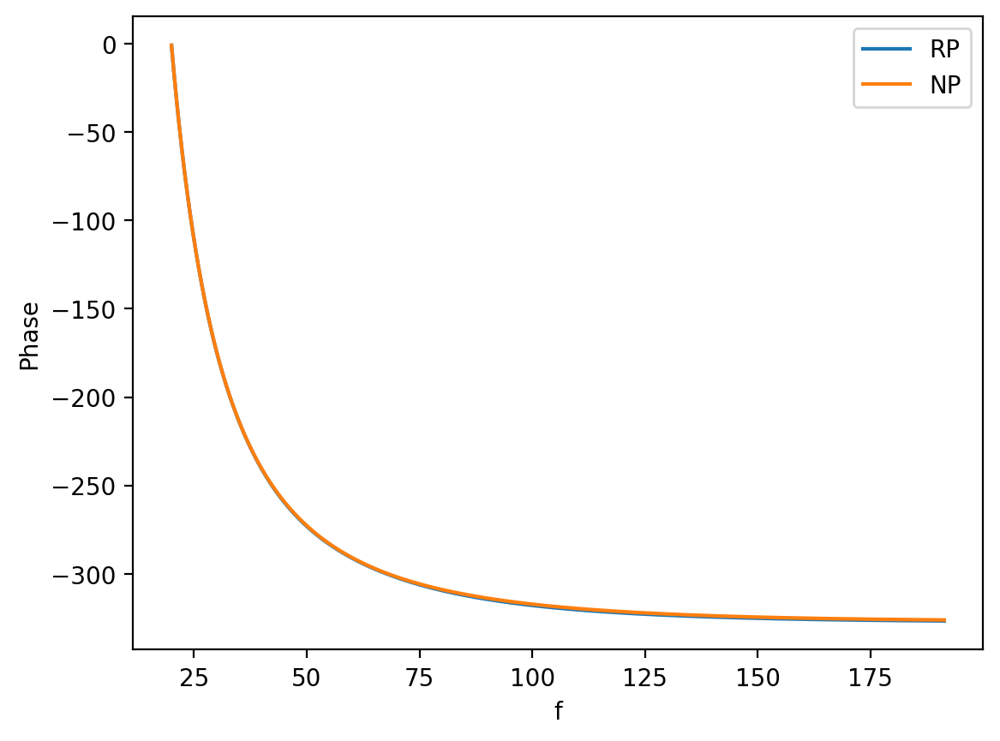

In [8]:
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

def_prec = Precessing(RP_params)
f_cut = def_prec.f_cut()
f_min = 20
delta_f = 0.05
f_range = np.arange(f_min, f_cut, delta_f)
precessing_strain = def_prec.strain(f_range)

def_non_prec = Precessing(NP_params)
f_cut_NP = def_non_prec.f_cut()
f_min_NP = 20
delta_f = 0.05
f_range_NP = np.arange(f_min_NP, f_cut_NP, delta_f)
non_precessing_strain = def_non_prec.strain(f_range_NP)

phase_RP = np.unwrap(np.angle(precessing_strain))
phase_NP = np.unwrap(np.angle(non_precessing_strain))

plt.plot(f_range, phase_RP, label="RP")
plt.plot(f_range, phase_NP, label="NP")
plt.legend()
plt.xlabel("f")
plt.ylabel("Phase")

Text(0, 0.5, 'Phase diff')

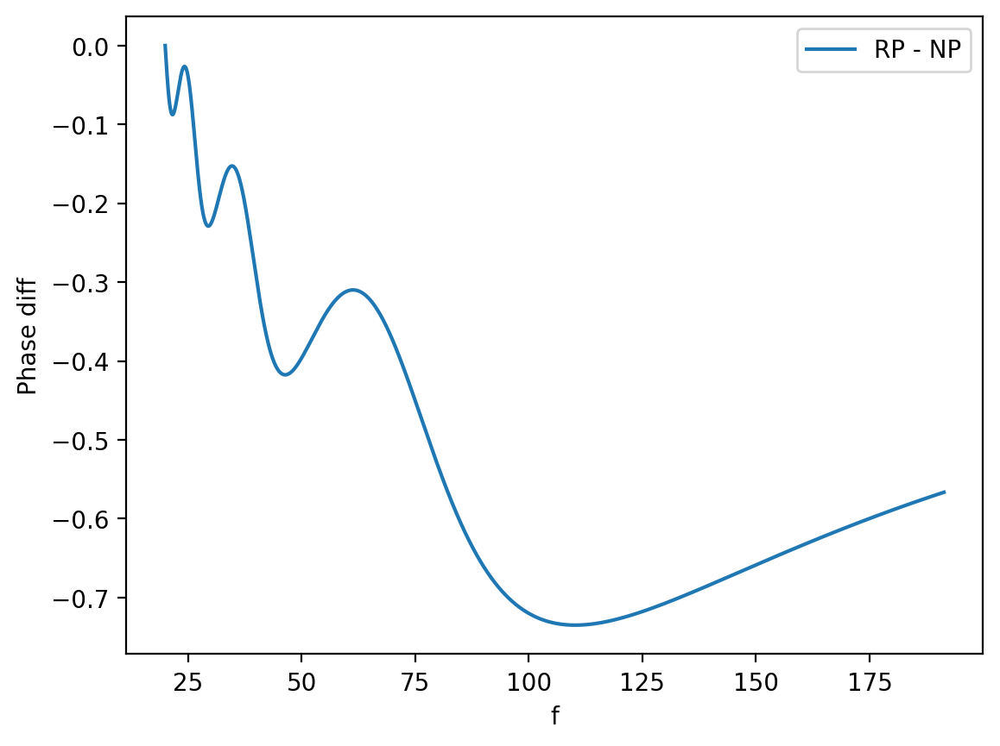

In [9]:
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

def_prec = Precessing(RP_params)
f_cut = def_prec.f_cut()
f_min = 20
delta_f = 0.05
f_range = np.arange(f_min, f_cut, delta_f)
precessing_strain = def_prec.strain(f_range)

def_non_prec = Precessing(NP_params)
non_precessing_strain = def_non_prec.strain(f_range)

phase_RP = np.unwrap(np.angle(precessing_strain))
phase_NP = np.unwrap(np.angle(non_precessing_strain))

plt.plot(f_range, phase_RP - phase_NP, label="RP - NP")

plt.legend()
plt.xlabel("f")
plt.ylabel("Phase diff")

In [45]:
# using sky_locs_J_S and sky_locs_S_S (Saif's choice)
sky_locs_J = sky_locs_J_S.copy()
sky_locs_S = sky_locs_S_S.copy()


def precession_plot_panel_phase_diff(
    param_name, param_unit, param_range, param_label, title
):
    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 10))
    fig.subplots_adjust(hspace=0.5)
    fig.subplots_adjust(wspace=0.5)

    for r, ((theta_J, phi_J), (theta_S, phi_S)) in enumerate(
        zip(sky_locs_J, sky_locs_S)
    ):
        RP_params["theta_J"] = NP_params["theta_J"] = theta_J
        RP_params["phi_J"] = NP_params["phi_J"] = phi_J
        RP_params["theta_S"] = NP_params["theta_S"] = theta_S
        RP_params["phi_S"] = NP_params["phi_S"] = phi_S

        ##
        for param in param_range:
            RP_params[param_name] = param * param_unit
            def_prec = Precessing(RP_params)
            f_cut = def_prec.f_cut()
            f_min = 20
            delta_f = 0.05
            f_range = np.arange(f_min, f_cut, delta_f)
            precessing_strain = def_prec.strain(f_range)
            phase_RP = np.unwrap(np.angle(precessing_strain))

            if param_name == "mcz":
                NP_params[param_name] = param * param_unit
            def_non_prec = Precessing(NP_params)
            f_cut_NP = def_non_prec.f_cut()
            f_min_NP = 20
            delta_f = 0.05
            f_range_NP = np.arange(
                f_min_NP, f_cut_NP, delta_f
            )  # should be the same as f_range for a given mcz
            non_precessing_strain = def_non_prec.strain(f_range_NP)
            phase_NP = np.unwrap(np.angle(non_precessing_strain))

            phase_diff = phase_RP - phase_NP
            phase_diff = np.unwrap(phase_diff - phase_diff[0])

            axes[r].plot(
                f_range, phase_diff, label="{} = {:.3g}".format(param_label, param)
            )
        ##

        axes[r].legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)
        axes[r].set_title(
            r"$\theta_J$ = {:.3g}, $\phi_J$ = {:.3g}, $\theta_S$ = {:.3g}, $\phi_S$ = {:.3g}".format(
                theta_J, phi_J, theta_S, phi_S
            )
        )

    fig.suptitle(title, fontsize=16)
    # set x and y labels for the entire panel
    fig.text(0.04, 0.5, "Phase diff", va="center", rotation="vertical")
    axes[-1].set_xlabel("f")

/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: divide by zero encountered in scalar divide
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: invalid value encountered in scalar multiply
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:105: RuntimeWarning: divide by zero encountered in divide
  tan_psi = num_psi / den_psi


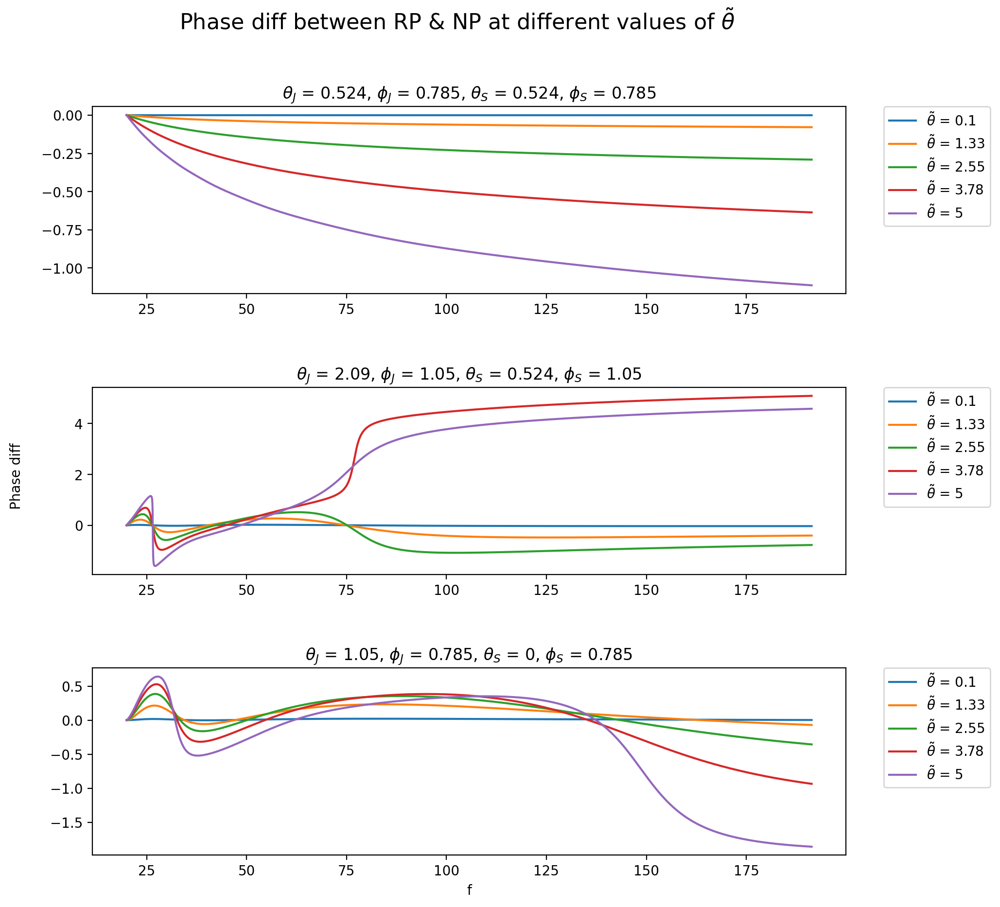

In [46]:
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

# using sky_locs_J_S and sky_locs_S_S (Saif's choice)
sky_locs_J = sky_locs_J_S.copy()
sky_locs_S = sky_locs_S_S.copy()

# change values of theta_tilde in RP_params
theta_tilde_range = np.linspace(0.1, 5, 5)

precession_plot_panel_phase_diff(
    "theta_tilde",
    1,
    theta_tilde_range,
    r"$\tilde{\theta}$",
    r"Phase diff between RP & NP at different values of $\tilde{\theta}$",
)

/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: divide by zero encountered in scalar divide
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: invalid value encountered in scalar multiply
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot


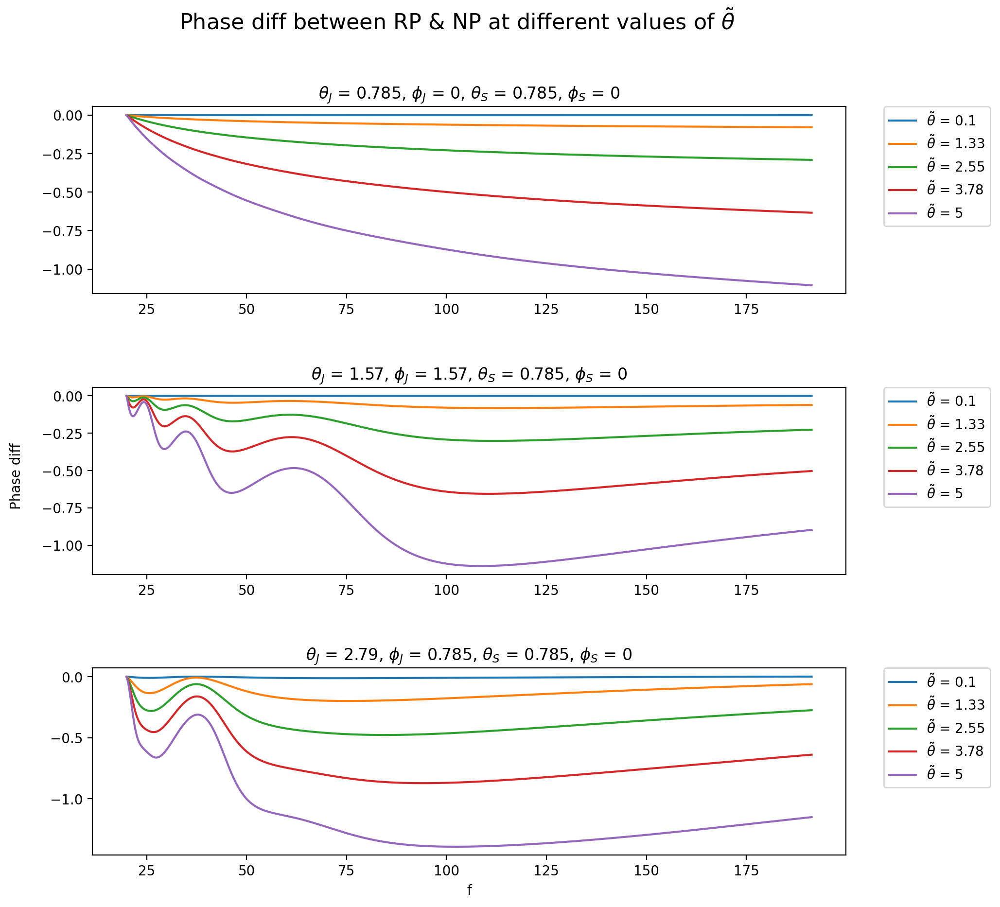

In [47]:
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

# using sky_locs_J_E and sky_locs_S_E (Evangelos's choice)
sky_locs_J = sky_locs_J_E.copy()
sky_locs_S = sky_locs_S_E.copy()

# change values of theta_tilde in RP_params
theta_tilde_range = np.linspace(0.1, 5, 5)

precession_plot_panel_phase_diff(
    "theta_tilde",
    1,
    theta_tilde_range,
    r"$\tilde{\theta}$",
    r"Phase diff between RP & NP at different values of $\tilde{\theta}$",
)

/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: divide by zero encountered in scalar divide
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: invalid value encountered in scalar multiply
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:105: RuntimeWarning: divide by zero encountered in divide
  tan_psi = num_psi / den_psi


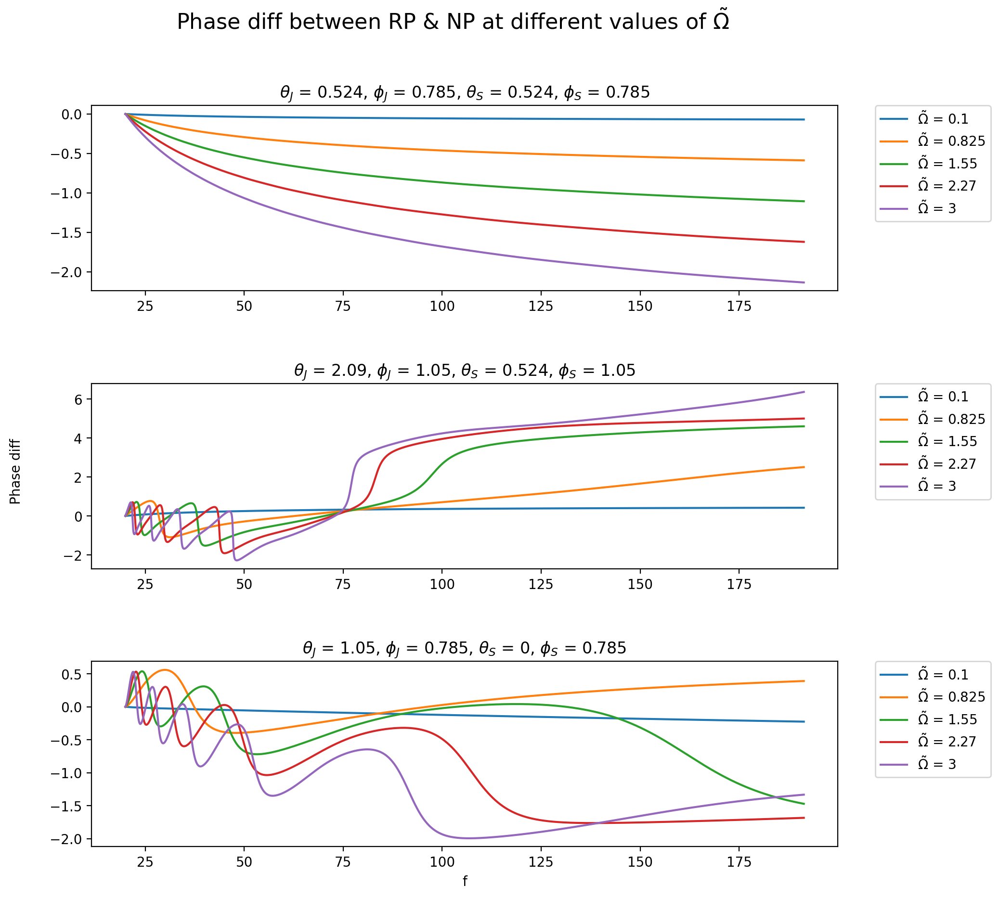

In [48]:
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

# using sky_locs_J_S and sky_locs_S_S (Saif's choice)
sky_locs_J = sky_locs_J_S.copy()
sky_locs_S = sky_locs_S_S.copy()

# change values of omega_tilde in RP_params
omega_tilde_range = np.linspace(0.1, 3, 5)

precession_plot_panel_phase_diff(
    "omega_tilde",
    1,
    omega_tilde_range,
    r"$\tilde{\Omega}$",
    r"Phase diff between RP & NP at different values of $\tilde{\Omega}$",
)

/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: divide by zero encountered in scalar divide
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: invalid value encountered in scalar multiply
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot


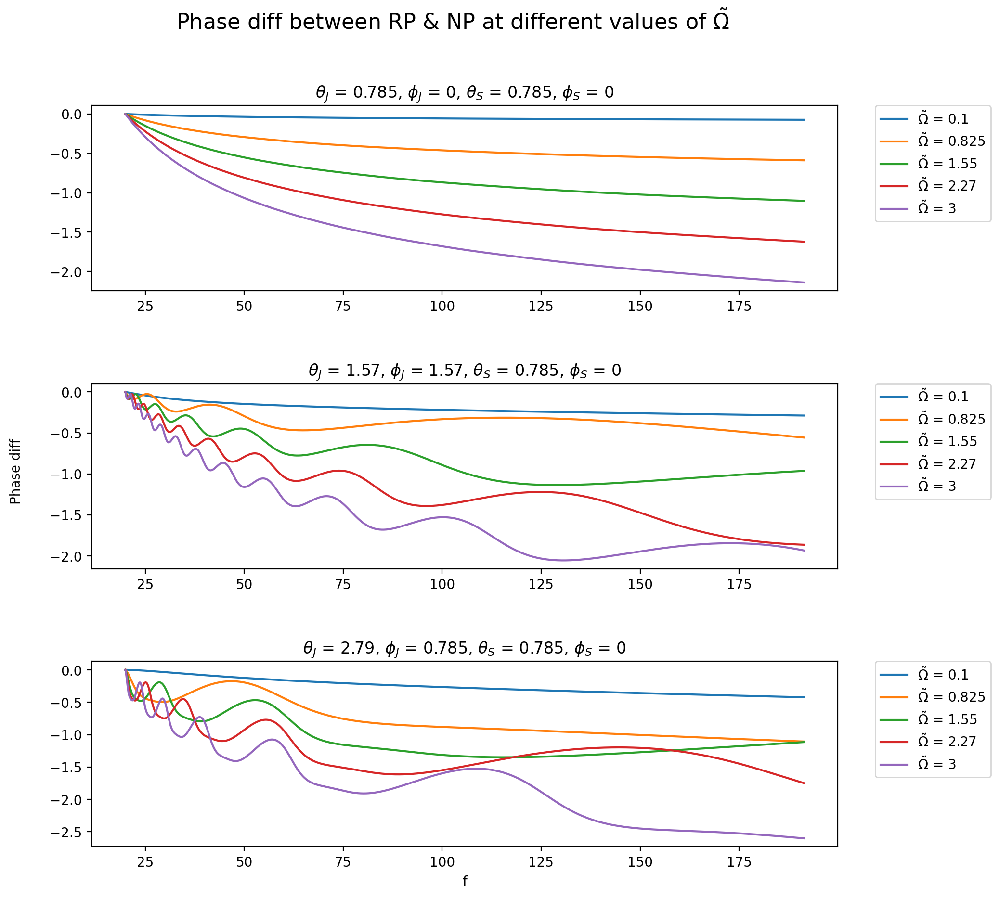

In [49]:
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

# using sky_locs_J_E and sky_locs_S_E (Evangelos's choice)
sky_locs_J = sky_locs_J_E.copy()
sky_locs_S = sky_locs_S_E.copy()

# change values of omega_tilde in RP_params
omega_tilde_range = np.linspace(0.1, 3, 5)

precession_plot_panel_phase_diff(
    "omega_tilde",
    1,
    omega_tilde_range,
    r"$\tilde{\Omega}$",
    r"Phase diff between RP & NP at different values of $\tilde{\Omega}$",
)

/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: divide by zero encountered in scalar divide
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: invalid value encountered in scalar multiply
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:105: RuntimeWarning: divide by zero encountered in divide
  tan_psi = num_psi / den_psi


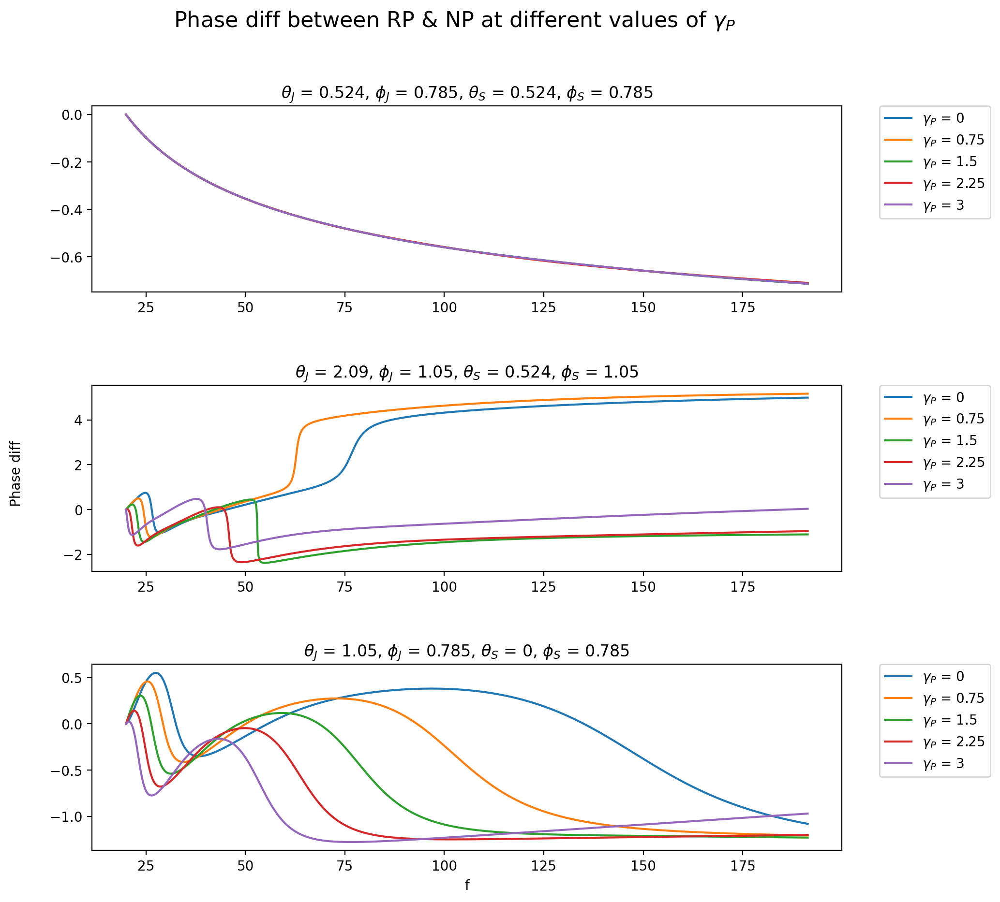

In [50]:
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

# using sky_locs_J_S and sky_locs_S_S (Saif's choice)
sky_locs_J = sky_locs_J_S.copy()
sky_locs_S = sky_locs_S_S.copy()

# change values of gamma_P in RP_params
gamma_P_range = np.linspace(0, 3, 5)

precession_plot_panel_phase_diff(
    "gamma_P",
    1,
    gamma_P_range,
    r"$\gamma_P$",
    r"Phase diff between RP & NP at different values of $\gamma_P$",
)

/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: divide by zero encountered in scalar divide
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: invalid value encountered in scalar multiply
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot


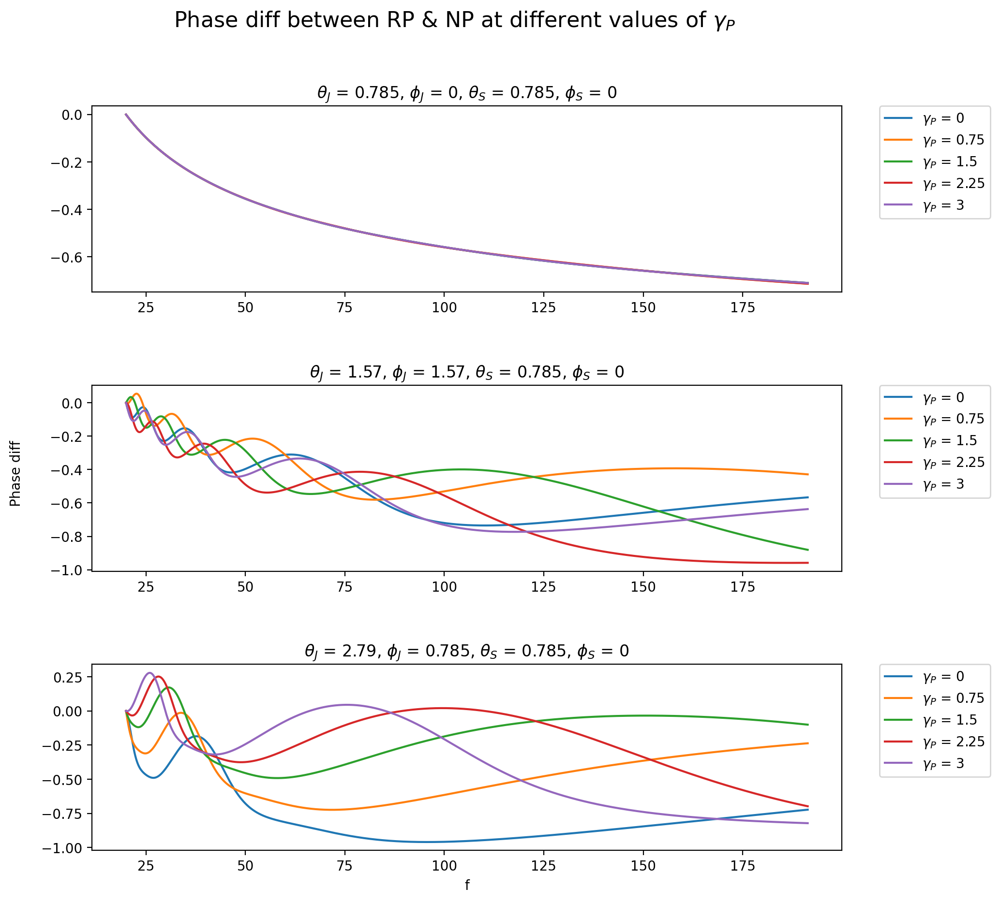

In [52]:
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

# using sky_locs_J_E and sky_locs_S_E (Evangelos's choice)
sky_locs_J = sky_locs_J_E.copy()
sky_locs_S = sky_locs_S_E.copy()

# change values of gamma_P in RP_params
gamma_P_range = np.linspace(0, 3, 5)

precession_plot_panel_phase_diff(
    "gamma_P",
    1,
    gamma_P_range,
    r"$\gamma_P$",
    r"Phase diff between RP & NP at different values of $\gamma_P$",
)

/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: divide by zero encountered in scalar divide
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: invalid value encountered in scalar multiply
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:105: RuntimeWarning: divide by zero encountered in divide
  tan_psi = num_psi / den_psi


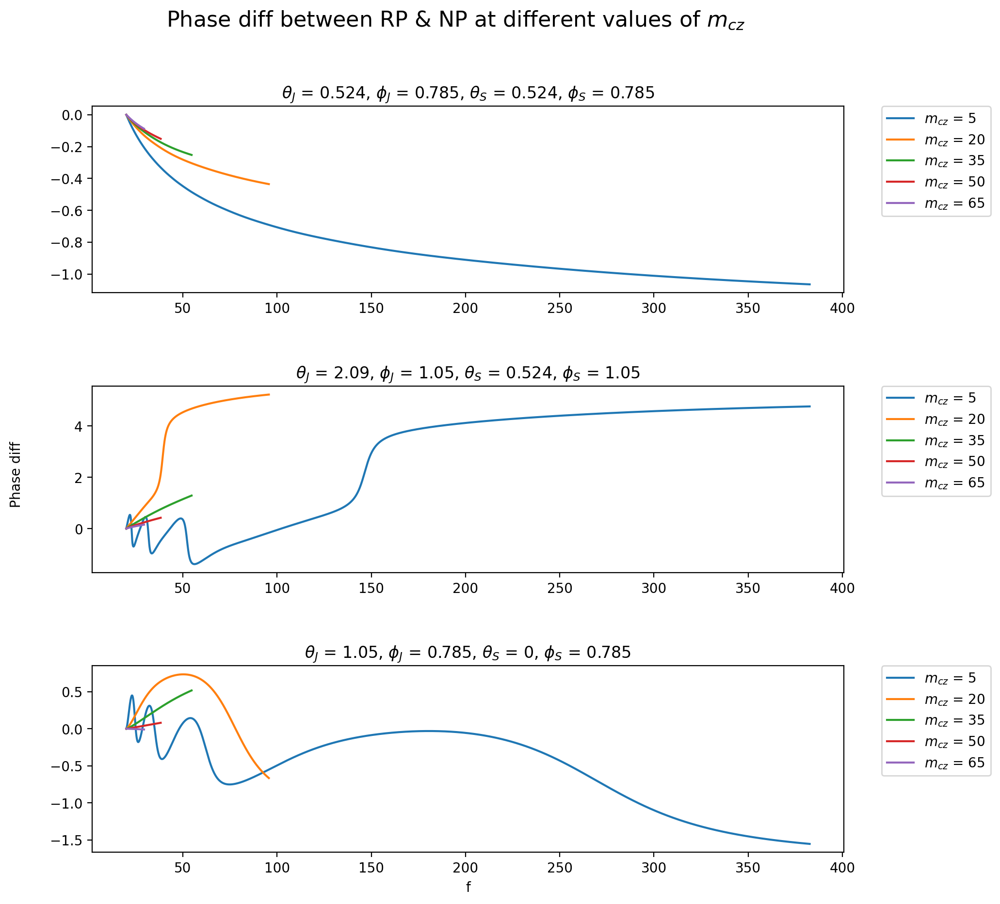

In [53]:
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

# using sky_locs_J_S and sky_locs_S_S (Saif's choice)
sky_locs_J = sky_locs_J_S.copy()
sky_locs_S = sky_locs_S_S.copy()

# change values of mcz in RP_params
mcz_range = np.linspace(5, 65, 5)

precession_plot_panel_phase_diff(
    "mcz",
    solar_mass,
    mcz_range,
    r"$m_{cz}$",
    r"Phase diff between RP & NP at different values of $m_{cz}$",
)

/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: divide by zero encountered in scalar divide
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: invalid value encountered in scalar multiply
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot


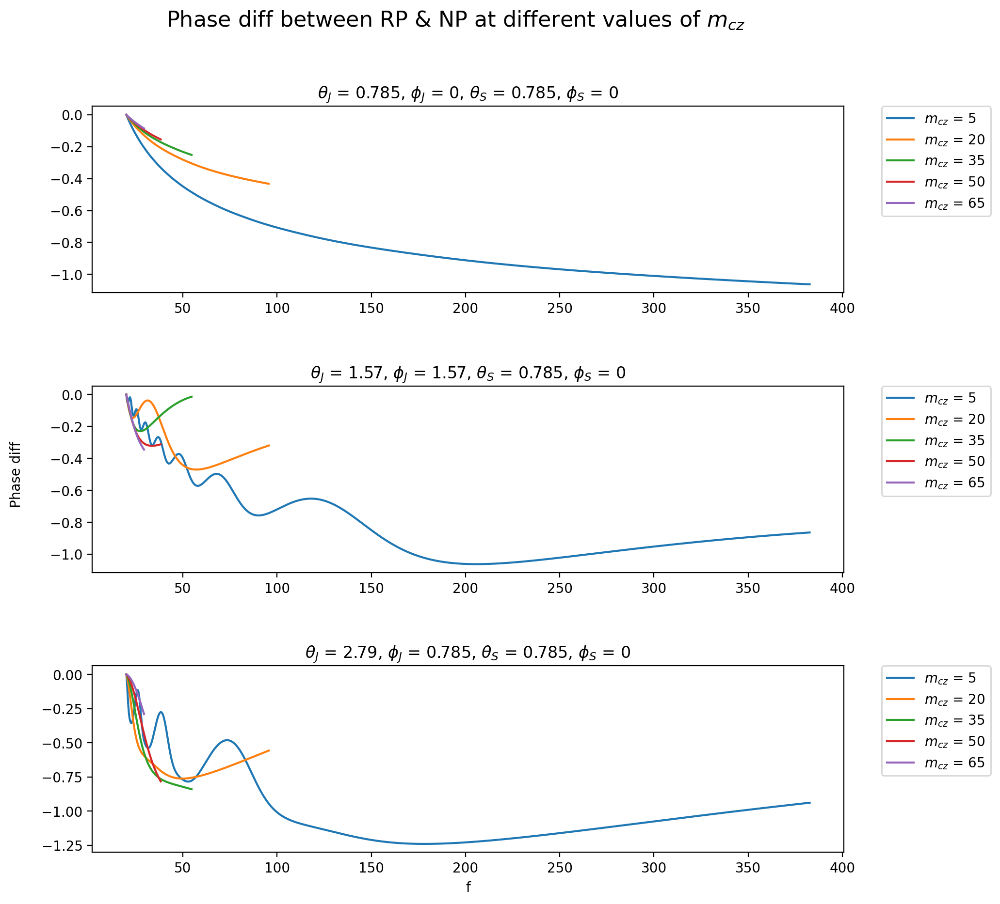

In [54]:
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

# using sky_locs_J_E and sky_locs_S_E (Evangelos's choice)
sky_locs_J = sky_locs_J_E.copy()
sky_locs_S = sky_locs_S_E.copy()

# change values of mcz in RP_params
mcz_range = np.linspace(5, 65, 5)

precession_plot_panel_phase_diff(
    "mcz",
    solar_mass,
    mcz_range,
    r"$m_{cz}$",
    r"Phase diff between RP & NP at different values of $m_{cz}$",
)

In [152]:
# make a slider plot for face-on with varying mcz and phi_J, phi_S


def slider_plot_mcz_FaceOn_phase_diff(phi, title):
    # set sky locations to face-on
    RP_params["theta_J"] = NP_params["theta_J"] = np.pi / 12
    RP_params["phi_J"] = NP_params["phi_J"] = phi
    RP_params["theta_S"] = NP_params["theta_S"] = np.pi / 12
    RP_params["phi_S"] = NP_params["phi_S"] = phi

    ##
    for mcz in mcz_range:
        RP_params["mcz"] = mcz * solar_mass
        def_prec = Precessing(RP_params)
        f_cut = def_prec.f_cut()
        f_min = 20
        delta_f = 0.05
        f_range = np.arange(f_min, f_cut, delta_f)
        precessing_strain = def_prec.strain(f_range)
        phase_RP = np.unwrap(np.angle(precessing_strain))

        NP_params["mcz"] = mcz * solar_mass
        def_non_prec = Precessing(NP_params)
        non_precessing_strain = def_non_prec.strain(f_range)
        phase_NP = np.unwrap(np.angle(non_precessing_strain))

        phase_diff = phase_RP - phase_NP
        phase_diff = phase_diff - phase_diff[0]

        plt.plot(
            f_range,
            phase_diff,
            label="RP - NP with {} = {:.3g}".format(r"$m_{cz}$", mcz),
        )
    ##

    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)
    plt.xlabel("f")
    plt.xlim(15, 100)
    plt.ylabel("Phase diff")
    plt.ylim(-0.5, 0.1)
    plt.title(title, fontsize=12)

In [153]:
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

# change values of mcz in RP_params
mcz_range = [20]

# vary phi from 0 to 2pi
phi_range = widgets.FloatSlider(
    min=0, max=2 * np.pi, step=np.pi / 4, value=np.pi, description="phi"
)

interact(
    slider_plot_mcz_FaceOn_phase_diff,
    phi=phi_range,
    title=fixed(
        r"Precession in face-on with different values of $m_{cz}$, $\phi_J$ & $\phi_S$"
    ),
)

interactive(children=(FloatSlider(value=3.141592653589793, description='phi', max=6.283185307179586, step=0.78…

# mismatch

## testing

Text(0, 0.5, '$\\epsilon$')

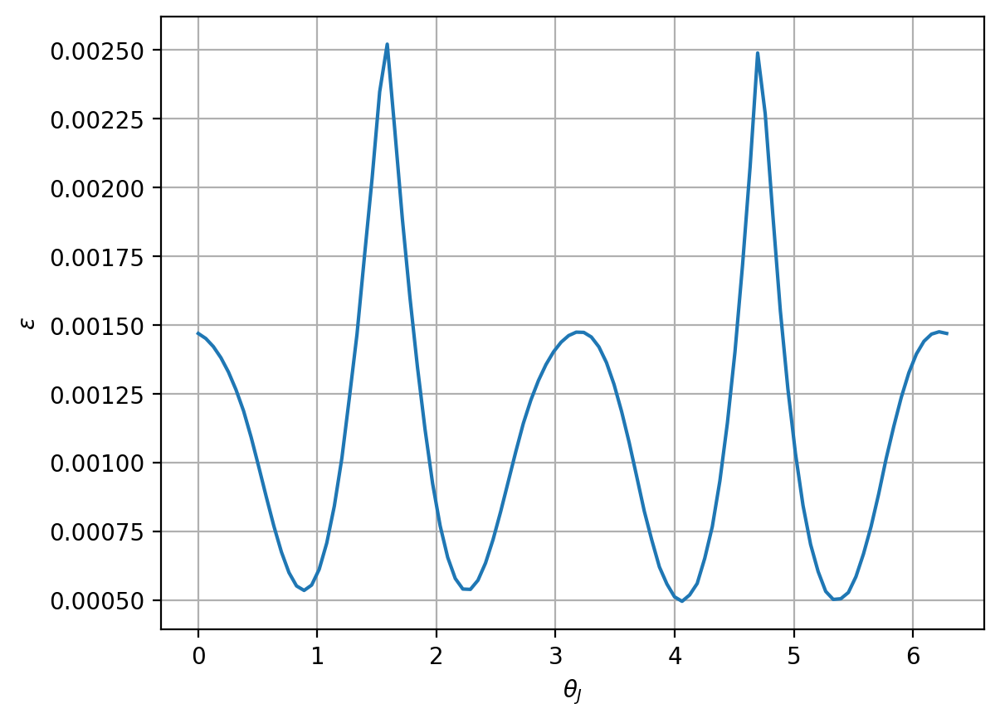

In [105]:
lensing_params = lensing_params_0.copy()
RP_params = RP_params_0.copy()

# set both lensing and precession parameters to same location

lensing_params["theta_L"] = RP_params["theta_J"] = np.pi / 2
lensing_params["phi_L"] = RP_params["phi_J"] = np.pi / 2
lensing_params["theta_S"] = RP_params["theta_S"] = np.pi / 4
lensing_params["phi_S"] = RP_params["phi_S"] = 0

# assign mcz as 50 solar masses for both lensing and precession
lensing_params["mcz"] = RP_params["mcz"] = 50 * solar_mass

# plot mismatch as a function of theta_J

theta_J_array = np.linspace(0, 2 * np.pi, 100)
ep_array = []

for theta_J in theta_J_array:
    lensing_params["theta_J"] = theta_J
    RP_params["theta_J"] = theta_J

    ep_min, g_min, ep_max, g_max, ep_0 = mismatch_epsilon_min_max(
        lensing_params, RP_params, NP_params, "L & RP"
    )

    ep_array.append(ep_min)

plt.plot(theta_J_array, ep_array, label=r"$\epsilon_{min}$")
plt.grid()
# plt.legend()
plt.xlabel(r"$\theta_J$")
plt.ylabel(r"$\epsilon$")

Text(0, 0.5, '$\\epsilon$')

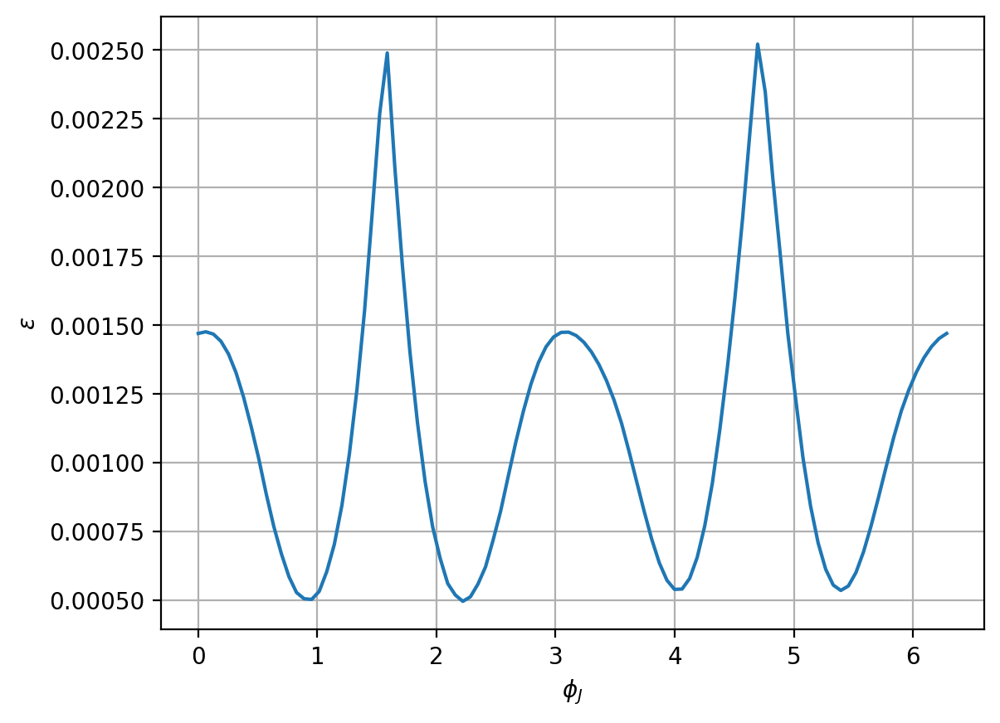

In [106]:
lensing_params = lensing_params_0.copy()
RP_params = RP_params_0.copy()

# set both lensing and precession parameters to same location

lensing_params["theta_L"] = RP_params["theta_J"] = np.pi / 2
lensing_params["phi_L"] = RP_params["phi_J"] = np.pi / 2
lensing_params["theta_S"] = RP_params["theta_S"] = np.pi / 4
lensing_params["phi_S"] = RP_params["phi_S"] = 0

# assign mcz as 50 solar masses for both lensing and precession
lensing_params["mcz"] = RP_params["mcz"] = 50 * solar_mass

# plot mismatch as a function of phi_J

phi_J_array = np.linspace(0, 2 * np.pi, 100)
ep_array = []

for phi_J in phi_J_array:
    lensing_params["phi_J"] = phi_J
    RP_params["phi_J"] = phi_J

    ep_min, g_min, ep_max, g_max, ep_0 = mismatch_epsilon_min_max(
        lensing_params, RP_params, NP_params, "L & RP"
    )

    ep_array.append(ep_min)

plt.plot(phi_J_array, ep_array, label=r"$\epsilon_{min}$")
plt.grid()
# plt.legend()
plt.xlabel(r"$\phi_J$")
plt.ylabel(r"$\epsilon$")

## lensing vs precessing examples

In [79]:
def h_comparison(sky_locs_J, sky_locs_S):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
    fig.subplots_adjust(hspace=0.5)
    fig.subplots_adjust(wspace=0.5)

    for (theta_J, phi_J), (theta_S, phi_S) in zip(sky_locs_J, sky_locs_S):
        # set both lensed and precessing to same location
        lensing_params["theta_L"] = RP_params["theta_J"] = theta_J
        lensing_params["phi_L"] = RP_params["phi_J"] = phi_J
        lensing_params["theta_S"] = RP_params["theta_S"] = theta_S
        lensing_params["phi_S"] = RP_params["phi_S"] = phi_S

        # plot lensed waveform
        MLz = 1000
        mcz = 50
        lensing_params["MLz"] = MLz * solar_mass
        lensing_params["mcz"] = mcz * solar_mass

        def_lens = Lensing(lensing_params)
        f_cut = def_lens.f_cut()
        f_min = 20
        f_range = np.linspace(f_min, f_cut, 10000)
        amp_fact = def_lens.F(f_range)
        unlensed_strain = def_lens.hI(f_range)
        lensed_strain = amp_fact * unlensed_strain

        # axes[0].loglog(f_range, np.abs(amp_fact*unlensed_strain), label = r'$\theta_L$ = {:.3g}, $\phi_L$ = {:.3g}, $\theta_S$ = {:.3g}, $\phi_S$ = {:.3g}'.format(theta_J, phi_J, theta_S, phi_S))
        axes[0].loglog(f_range, np.abs(lensed_strain))
        axes[0].set_xlabel("f")
        axes[0].set_ylabel("|h|")
        axes[0].set_title(
            "Lensed with {} = {} & {} = {}".format(r"$M_{Lz}$", MLz, r"$m_{cz}$", mcz)
        )

        # plot precessing waveform
        mcz = 50
        RP_params["mcz"] = mcz * solar_mass

        def_prec = Precessing(RP_params)
        f_cut = def_prec.f_cut()
        f_min = 20
        delta_f = 0.05
        f_range = np.arange(f_min, f_cut, delta_f)
        precessing_strain = def_prec.strain(f_range)

        axes[1].loglog(
            f_range,
            np.abs(precessing_strain),
            label=r"$\theta_J$ = {:.3g}, $\phi_J$ = {:.3g}, $\theta_S$ = {:.3g}, $\phi_S$ = {:.3g}".format(
                theta_J, phi_J, theta_S, phi_S
            ),
        )
        axes[1].set_xlabel("f")
        axes[1].set_ylabel("|h|")
        axes[1].set_title("RP with {} = {}".format(r"$m_{cz}$", mcz))

    # set a legend for the entire panel
    axes[1].legend(bbox_to_anchor=(1.05, 1), loc="best", borderaxespad=0.0)

In [80]:
def phase_diff_L_RP(sky_locs_J, sky_locs_S):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(12, 6))
    fig.subplots_adjust(hspace=0.5)
    fig.subplots_adjust(wspace=0.5)

    for (theta_J, phi_J), (theta_S, phi_S) in zip(sky_locs_J, sky_locs_S):
        # set both lensed and precessing to same location
        lensing_params["theta_L"] = RP_params["theta_J"] = theta_J
        lensing_params["phi_L"] = RP_params["phi_J"] = phi_J
        lensing_params["theta_S"] = RP_params["theta_S"] = theta_S
        lensing_params["phi_S"] = RP_params["phi_S"] = phi_S

        # plot phase diff between lensed and precessing waveforms
        MLz = 1000
        mcz = 50

        lensing_params["MLz"] = MLz * solar_mass
        lensing_params["mcz"] = mcz * solar_mass
        def_lens = Lensing(lensing_params)
        f_cut = def_lens.f_cut()
        f_min = 20
        f_range = np.linspace(f_min, f_cut, 10000)
        amp_fact = def_lens.F(f_range)
        unlensed_strain = def_lens.hI(f_range)
        lensed_strain = amp_fact * unlensed_strain
        phase_L = np.unwrap(np.angle(lensed_strain))

        RP_params["mcz"] = mcz * solar_mass
        def_prec = Precessing(RP_params)
        precessing_strain = def_prec.strain(f_range)
        phase_RP = np.unwrap(np.angle(precessing_strain))

        phase_diff = phase_L - phase_RP
        phase_diff = phase_diff - phase_diff[0]  # set the initial phase diff to 0

        axes.plot(
            f_range,
            phase_diff,
            label=r"$\theta_J$ = {:.3g}, $\phi_J$ = {:.3g}, $\theta_S$ = {:.3g}, $\phi_S$ = {:.3g}".format(
                theta_J, phi_J, theta_S, phi_S
            ),
        )
        axes.set_xlabel("f")
        axes.set_ylabel("Phase diff")
        axes.set_title(
            "Phase diff between Lensed and RP with {} = {} & {} = {}".format(
                r"$M_{Lz}$", MLz, r"$m_{cz}$", mcz
            )
        )
        axes.legend(bbox_to_anchor=(1.05, 1), loc="best", borderaxespad=0.0)

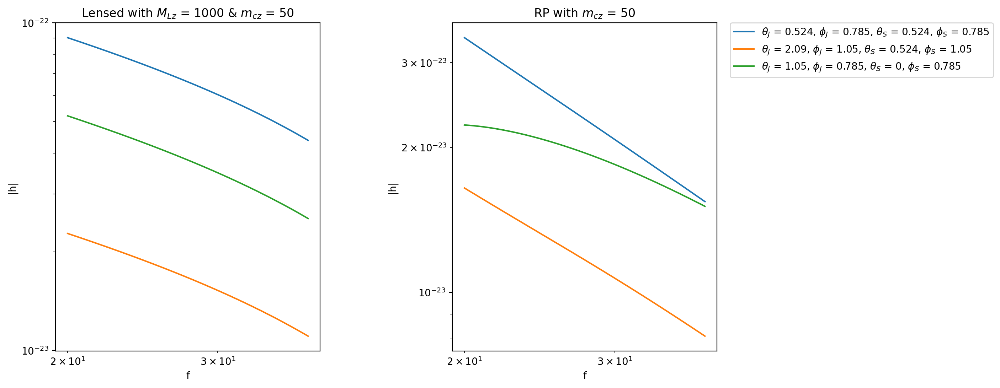

In [123]:
lensing_params = lensing_params_0.copy()
RP_params = RP_params_0.copy()

# using Saif's choice of sky locations
h_comparison(sky_locs_J_S, sky_locs_S_S)

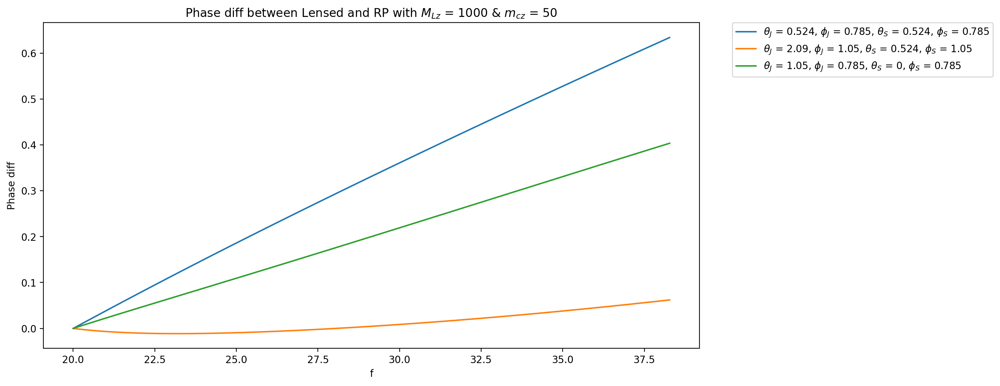

In [127]:
lensing_params = lensing_params_0.copy()
RP_params = RP_params_0.copy()

# using Saif's choice of sky locations
phase_diff_L_RP(sky_locs_J_S, sky_locs_S_S)

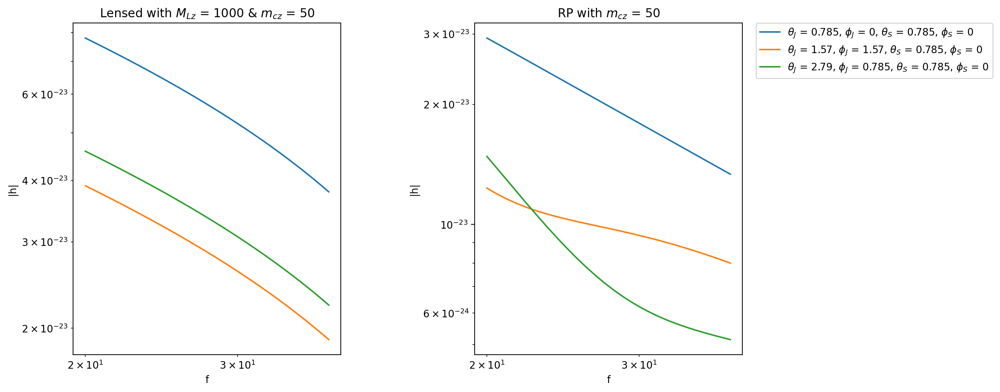

In [128]:
lensing_params = lensing_params_0.copy()
RP_params = RP_params_0.copy()

# using Evangelos's choice of sky locations
h_comparison(sky_locs_J_E, sky_locs_S_E)

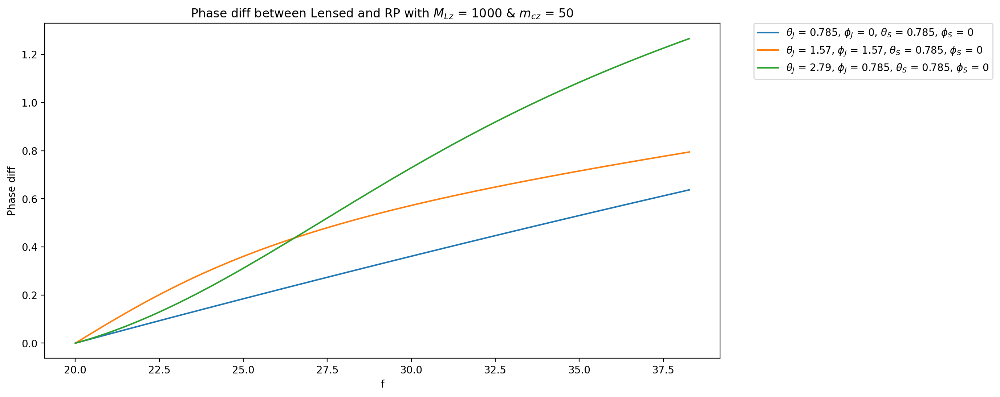

In [129]:
lensing_params = lensing_params_0.copy()
RP_params = RP_params_0.copy()

# using Evangelos's choice of sky locations
phase_diff_L_RP(sky_locs_J_E, sky_locs_S_E)

## plot mismatch

In [86]:
def mismatch_plot_panel(param_name, param_unit, param_array, param_label, title):
    # plot mismatch as a function of param_name

    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))
    fig.subplots_adjust(hspace=0.5)
    fig.subplots_adjust(wspace=0.5)

    for r, ((theta_J, phi_J), (theta_S, phi_S)) in enumerate(
        zip(sky_locs_J, sky_locs_S)
    ):
        # set lensed, RP, NP to same location
        lensing_params["theta_L"] = RP_params["theta_J"] = NP_params[
            "theta_J"
        ] = theta_J
        lensing_params["phi_L"] = RP_params["phi_J"] = NP_params["phi_J"] = phi_J
        lensing_params["theta_S"] = RP_params["theta_S"] = NP_params[
            "theta_S"
        ] = theta_S
        lensing_params["phi_S"] = RP_params["phi_S"] = NP_params["phi_S"] = phi_S

        for cmd in ["L & RP", "L & NP", "RP & NP"]:
            ep_array = []

            for param in param_array:
                lensing_params[param_name] = param * param_unit
                RP_params[param_name] = param * param_unit
                NP_params[param_name] = param * param_unit

                ep_min, g_min, ep_max, g_max, ep_0 = mismatch_epsilon_min_max(
                    lensing_params, RP_params, NP_params, cmd
                )

                ep_array.append(ep_min)

            ls = {"L & RP": "-", "L & NP": "--", "RP & NP": ":"}
            color = plt.rcParams["axes.prop_cycle"].by_key()["color"][r]
            axes[r].plot(param_array, ep_array, ls=ls[cmd], color=color, label=cmd)
            axes[r].legend()
            axes[r].set_xlabel(param_label)
            axes[r].set_ylabel(r"$\epsilon$")
            axes[r].set_title(
                r"$\theta_J$ = {:.3g}, $\phi_J$ = {:.3g}, $\theta_S$ = {:.3g}, $\phi_S$ = {:.3g}".format(
                    theta_J, phi_J, theta_S, phi_S
                )
            )

    fig.suptitle(title, fontsize=16)

/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_2363/4085207729.py:159: RuntimeWarning: divide by zero encountered in scalar divide
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_2363/4085207729.py:159: RuntimeWarning: invalid value encountered in scalar multiply
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_2363/4085207729.py:105: RuntimeWarning: divide by zero encountered in divide
  tan_psi = num_psi / den_psi


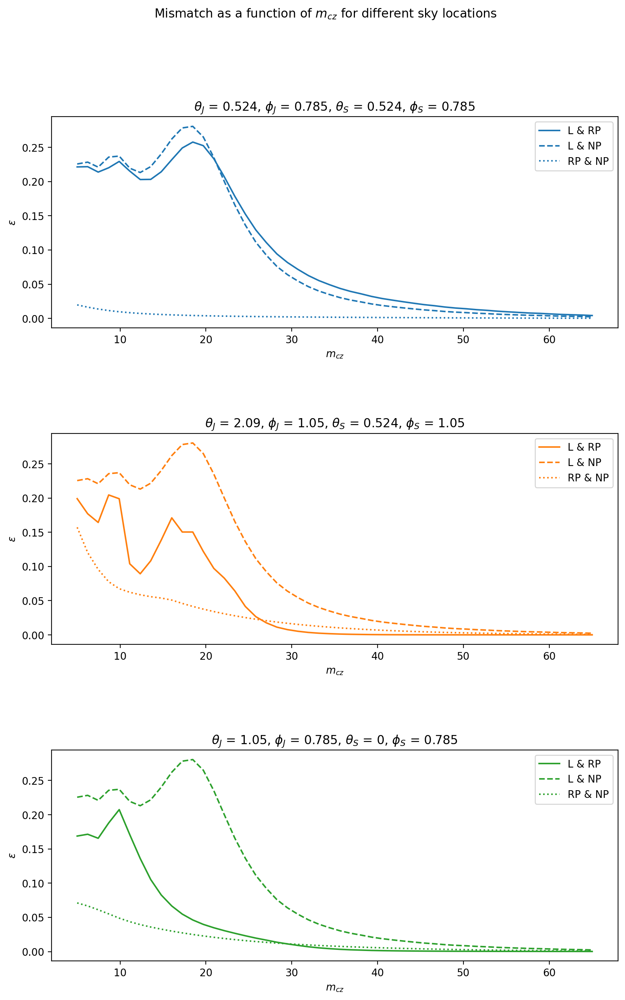

In [158]:
lensing_params = lensing_params_0.copy()
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

# using Saif's choice of sky locations
sky_locs_J = sky_locs_J_S.copy()
sky_locs_S = sky_locs_S_S.copy()

# plot mismatch panel as a function of mcz
mcz_array = np.linspace(5, 65, 50)
mismatch_plot_panel(
    "mcz",
    solar_mass,
    mcz_array,
    r"$m_{cz}$",
    r"Mismatch as a function of $m_{cz}$ for different sky locations",
)

/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: divide by zero encountered in scalar divide
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: invalid value encountered in scalar multiply
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:105: RuntimeWarning: divide by zero encountered in divide
  tan_psi = num_psi / den_psi


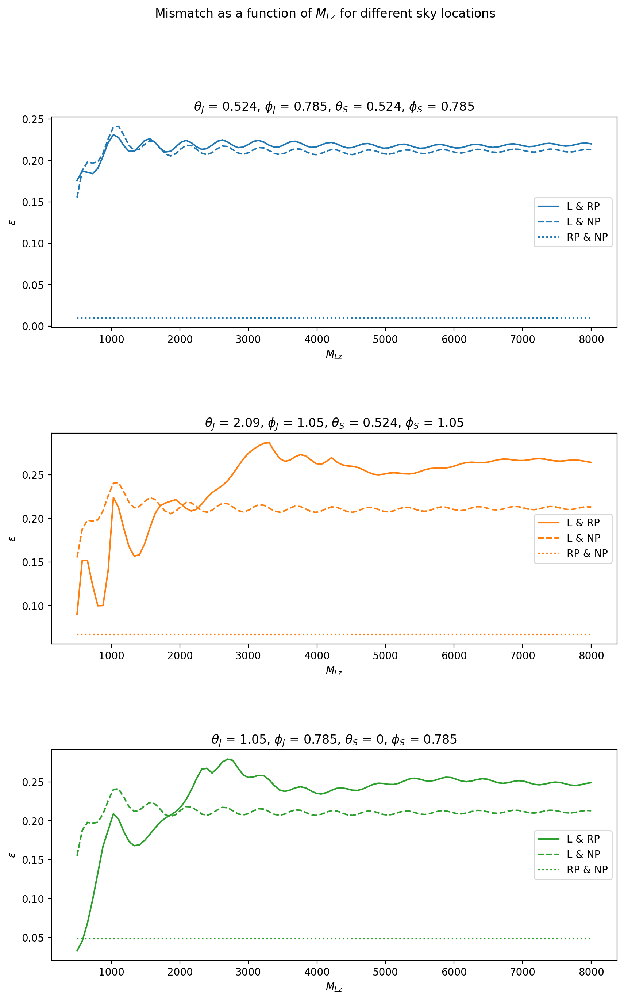

In [82]:
lensing_params = lensing_params_0.copy()
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()
# mcz = 10 by default

# using Saif's choice of sky locations
sky_locs_J = sky_locs_J_S.copy()
sky_locs_S = sky_locs_S_S.copy()

# plot mismatch panel as a function of MLz
MLz_array = np.linspace(500, 8000, 100)
mismatch_plot_panel(
    "MLz",
    solar_mass,
    MLz_array,
    r"$M_{Lz}$",
    r"Mismatch at $m_{cz} = 10 M_{\odot}$, as a function of $M_{Lz}$ for different sky locations",
)

/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: divide by zero encountered in scalar divide
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: invalid value encountered in scalar multiply
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:105: RuntimeWarning: divide by zero encountered in divide
  tan_psi = num_psi / den_psi


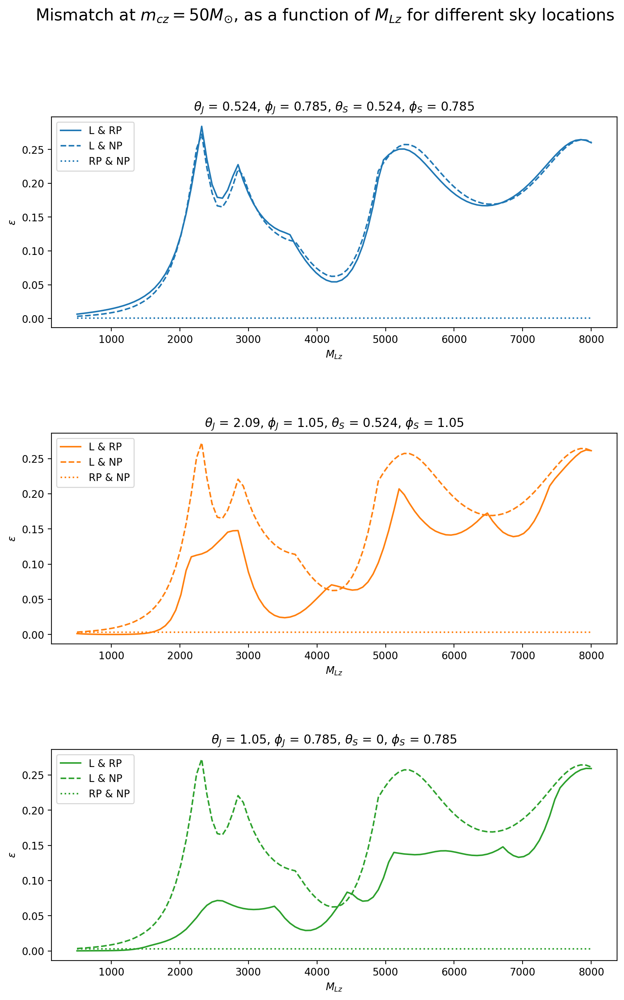

In [87]:
lensing_params = lensing_params_0.copy()
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

# using Saif's choice of sky locations
sky_locs_J = sky_locs_J_S.copy()
sky_locs_S = sky_locs_S_S.copy()

# assign mcz to 50
mcz = 50
lensing_params["mcz"] = RP_params["mcz"] = NP_params["mcz"] = mcz * solar_mass

# plot mismatch panel as a function of MLz
MLz_array = np.linspace(500, 8000, 100)
mismatch_plot_panel(
    "MLz",
    solar_mass,
    MLz_array,
    r"$M_{Lz}$",
    r"Mismatch at $m_{cz}$ = 50 $M_{\odot}$, as a function of $M_{Lz}$ for different sky locations",
)

/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: divide by zero encountered in scalar divide
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:159: RuntimeWarning: invalid value encountered in scalar multiply
  integrand_delta_phi = (LdotN / (1 - LdotN**2)) * Omega_LJ * np.sin(self.get_theta_LJ(f)) * ( np.cos(self.get_theta_LJ(f)) * sin_i_JN * np.sin(self.get_phi_LJ(f)) - np.sin(self.get_theta_LJ(f)) * cos_i_JN ) / f_dot
/var/folders/y_/v4l1jv1j5b55928djlvnhnm40000gp/T/ipykernel_4117/4085207729.py:105: RuntimeWarning: divide by zero encountered in divide
  tan_psi = num_psi / den_psi


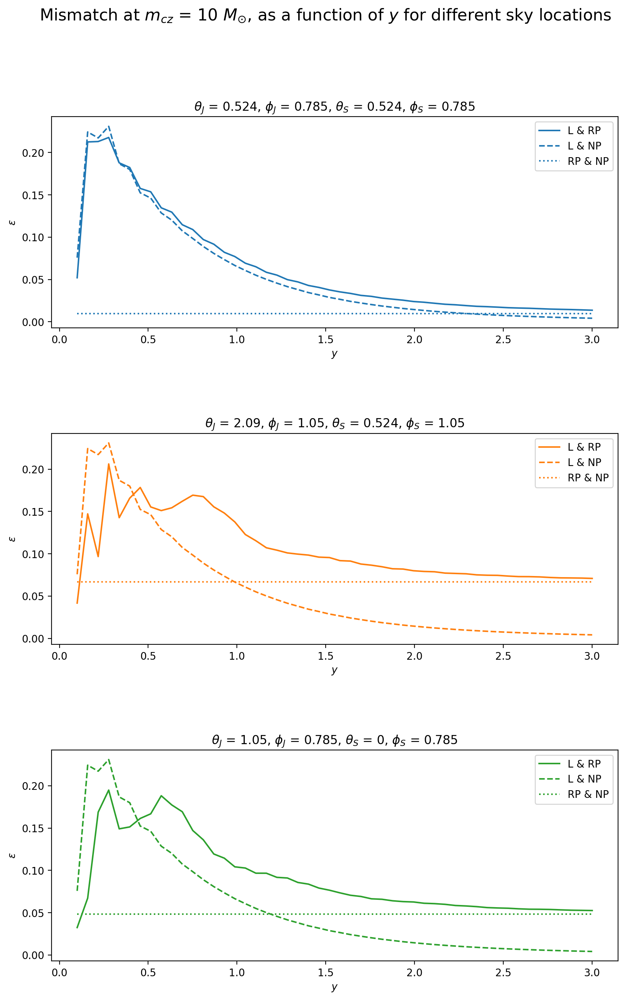

In [88]:
lensing_params = lensing_params_0.copy()
RP_params = RP_params_0.copy()
NP_params = NP_params_0.copy()

# using Saif's choice of sky locations
sky_locs_J = sky_locs_J_S.copy()
sky_locs_S = sky_locs_S_S.copy()

# plot mismatch panel as a function of y
y_array = np.linspace(0.1, 3, 50)
mismatch_plot_panel(
    "y",
    1,
    y_array,
    r"$y$",
    r"Mismatch at $m_{cz}$ = 10 $M_{\odot}$, as a function of $y$ for different sky locations",
)